# Load modules
[#Load-ensemble-mean](#Load-ensemble-mean)  
[#Check-monthly-data](#Check-monthly-data)  
[#Annual-Climatology](#Annual-Climatology)  
[#Bias](#Bias)  
[#Annual-cycle-ensemble-mean](#Annual-cycle-ensemble-mean)  
[#Time-series](#Time-series)  
[#Trends](#Trends)  
[#Link-with-orography?](#Link-with-orography?)  

In [1]:
# To reload external files automatically (ex: utils)
%load_ext autoreload
%autoreload 2

import xarray as xr
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle # For rectangles
import proplot as plot # New plot library (https://proplot.readthedocs.io/en/latest/)
from scipy import stats # For linregress (trends)
import xesmf as xe # For regridding (https://xesmf.readthedocs.io/en/latest/)

import sys
sys.path.insert(1, '../../../') # to include my util file in previous directory
import utils as u # my personal functions
u.check_python_version()
u.check_virtual_memory()

3.8.2 | packaged by conda-forge | (default, Feb 28 2020, 17:15:22) 
[GCC 7.3.0]
Virtual memory usage - total: 252 GB / available: 196 GB / percent used: 22.0 %


# Load model data

In [2]:
# Define period
period = slice('1981','2014')

# Define zone
latlim=(10,50)
lonlim=(60,110)

# Model
institute = 'IPSL'
model = 'IPSL-CM6A-LR'
var = 'snc'
if var in ['tas', 'pr']:
    table = 'Amon'
elif var in ['snc']:
    table = 'LImon'
    
var_label = 'Snow cover extent [%]'
var_label_trends = 'Snow cover extent trends [%/dec]'
var_label_bias = 'Snow cover bias [%]'
cmap='viridis'
levels=plot.arange(0,100,10)

[#Load-ensemble-mean](#Load-ensemble-mean)

## Load first member

In [3]:
realization = 'r1i1p1f1'

# Load historical
da_historical = xr.open_mfdataset(
    '/bdd/CMIP6/CMIP/'+institute+'/'+model+'/historical/'+realization+'/'+table+'/'+var+'/gr/latest/*.nc', combine='by_coords'
).sel(time=period)[var]

# Load amip
da_amip = xr.open_mfdataset(
    '/bdd/CMIP6/CMIP/'+institute+'/'+model+'/amip/'+realization+'/'+table+'/'+var+'/gr/latest/*.nc', combine='by_coords'
).sel(time=period)[var]

# Load land-hist
da_land_hist = xr.open_mfdataset(
    '/bdd/CMIP6/LS3MIP/'+institute+'/'+model+'/land-hist/'+realization+'/'+table+'/'+var+'/gr/latest/*.nc', combine='by_coords'
).sel(time=period)[var]

# Load HighResMIP
da_HR = xr.open_mfdataset(
    '/bdd/CMIP6/HighResMIP/'+institute+'/IPSL-CM6A-ATM-HR/highresSST-present/'+realization+'/'+table+'/'+var+'/gr/latest/*.nc', combine='by_coords'
).sel(time=period)[var]

## Create ensemble mean

### da_historical

In [11]:
realization = '*'
experiment = 'historical'

da_historical_ens = xr.open_mfdataset(
    '/bdd/CMIP6/CMIP/'+institute+'/'+model+'/'+experiment+'/'+realization+'/'+table+'/'+var+'/gr/latest/*.nc', 
    combine='nested', concat_dim='realization', parallel=True
).sel(time=period)[var]

da_historical_ens

<xarray.DataArray 'snc' (realization: 32, time: 408, lat: 143, lon: 144)>
dask.array<getitem, shape=(32, 408, 143, 144), dtype=float32, chunksize=(1, 408, 143, 144), chunktype=numpy.ndarray>
Coordinates:
  * lat      (lat) float32 -90.0 -88.73239 -87.46479 ... 87.46479 88.73239 90.0
  * time     (time) datetime64[ns] 1981-01-16T12:00:00 ... 2014-12-16T12:00:00
  * lon      (lon) float32 0.0 2.5 5.0 7.5 10.0 ... 350.0 352.5 355.0 357.5
Dimensions without coordinates: realization
Attributes:
    long_name:           Snow Area Fraction
    units:               %
    online_operation:    average
    cell_methods:        area: time: mean
    interval_operation:  900 s
    interval_write:      1 month
    standard_name:       surface_snow_area_fraction
    description:         Fraction of each grid cell that is occupied by snow ...
    history:             none
    cell_measures:       area: areacella

In [12]:
ens = da_historical_ens.mean('realization', keep_attrs=True)
ens.attrs['realization'] = da_historical_ens.realization.size
ens

<xarray.DataArray 'snc' (time: 408, lat: 143, lon: 144)>
dask.array<mean_agg-aggregate, shape=(408, 143, 144), dtype=float32, chunksize=(408, 143, 144), chunktype=numpy.ndarray>
Coordinates:
  * lat      (lat) float32 -90.0 -88.73239 -87.46479 ... 87.46479 88.73239 90.0
  * time     (time) datetime64[ns] 1981-01-16T12:00:00 ... 2014-12-16T12:00:00
  * lon      (lon) float32 0.0 2.5 5.0 7.5 10.0 ... 350.0 352.5 355.0 357.5
Attributes:
    long_name:           Snow Area Fraction
    units:               %
    online_operation:    average
    cell_methods:        area: time: mean
    interval_operation:  900 s
    interval_write:      1 month
    standard_name:       surface_snow_area_fraction
    description:         Fraction of each grid cell that is occupied by snow ...
    history:             none
    cell_measures:       area: areacella
    realization:         32

In [16]:
root_path='/data/mlalande/bdd/CMIP6/CMIP/'+institute+'/'+model+'/'+experiment+'/ens/'+table+'/'+var+'/gr/latest'
root_path
# mkdir -p root_path

'/data/mlalande/bdd/CMIP6/CMIP/IPSL/IPSL-CM6A-LR/historical/ens/LImon/snc/gr/latest'

In [17]:
ens.to_netcdf(root_path+'/'+var+'_'+table+'_'+model+'_'+experiment+'_ens_gr_198101-201412.nc')

/home/mlalande/miniconda3/lib/python3.7/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: divide by zero encountered in true_divide
  x = np.divide(x1, x2, out)
/home/mlalande/miniconda3/lib/python3.7/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


### da_amip

In [21]:
realization = '*'
experiment = 'amip'

da_amip = xr.open_mfdataset(
    '/bdd/CMIP6/CMIP/'+institute+'/'+model+'/'+experiment+'/'+realization+'/'+table+'/'+var+'/gr/latest/*-201412.nc', 
    combine='nested', concat_dim='realization', parallel=True
).sel(time=period)[var]
da_amip

<xarray.DataArray 'snc' (realization: 21, time: 408, lat: 143, lon: 144)>
dask.array<getitem, shape=(21, 408, 143, 144), dtype=float32, chunksize=(1, 408, 143, 144), chunktype=numpy.ndarray>
Coordinates:
  * lat      (lat) float32 -90.0 -88.73239 -87.46479 ... 87.46479 88.73239 90.0
  * time     (time) datetime64[ns] 1981-01-16T12:00:00 ... 2014-12-16T12:00:00
  * lon      (lon) float32 0.0 2.5 5.0 7.5 10.0 ... 350.0 352.5 355.0 357.5
Dimensions without coordinates: realization
Attributes:
    long_name:           Snow Area Fraction
    units:               %
    online_operation:    average
    cell_methods:        area: time: mean
    interval_operation:  900 s
    interval_write:      1 month
    standard_name:       surface_snow_area_fraction
    description:         Fraction of each grid cell that is occupied by snow ...
    history:             none
    cell_measures:       area: areacella

In [22]:
ens = da_amip.mean('realization', keep_attrs=True)
ens.attrs['realization'] = da_amip.realization.size
ens

<xarray.DataArray 'snc' (time: 408, lat: 143, lon: 144)>
dask.array<mean_agg-aggregate, shape=(408, 143, 144), dtype=float32, chunksize=(408, 143, 144), chunktype=numpy.ndarray>
Coordinates:
  * lat      (lat) float32 -90.0 -88.73239 -87.46479 ... 87.46479 88.73239 90.0
  * time     (time) datetime64[ns] 1981-01-16T12:00:00 ... 2014-12-16T12:00:00
  * lon      (lon) float32 0.0 2.5 5.0 7.5 10.0 ... 350.0 352.5 355.0 357.5
Attributes:
    long_name:           Snow Area Fraction
    units:               %
    online_operation:    average
    cell_methods:        area: time: mean
    interval_operation:  900 s
    interval_write:      1 month
    standard_name:       surface_snow_area_fraction
    description:         Fraction of each grid cell that is occupied by snow ...
    history:             none
    cell_measures:       area: areacella
    realization:         21

In [23]:
root_path='/data/mlalande/bdd/CMIP6/CMIP/'+institute+'/'+model+'/'+experiment+'/ens/'+table+'/'+var+'/gr/latest'
root_path
# mkdir -p root_path

'/data/mlalande/bdd/CMIP6/CMIP/IPSL/IPSL-CM6A-LR/amip/ens/LImon/snc/gr/latest'

In [24]:
ens.to_netcdf(root_path+'/'+var+'_'+table+'_'+model+'_'+experiment+'_ens_gr_198101-201412.nc')

/home/mlalande/miniconda3/lib/python3.7/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: divide by zero encountered in true_divide
  x = np.divide(x1, x2, out)
/home/mlalande/miniconda3/lib/python3.7/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


# Load ensemble mean
[#Load-ensemble-mean](#Load-ensemble-mean)  
[#Check-monthly-data](#Check-monthly-data)  
[#Annual-Climatology](#Annual-Climatology)  
[#Bias](#Bias)  
[#Annual-cycle-ensemble-mean](#Annual-cycle-ensemble-mean)  
[#Time-series](#Time-series)  
[#Trends](#Trends)  
[#Link-with-orography?](#Link-with-orography?) 

In [3]:
realization = 'ens'
# Load historical ens
experiment='historical'
da_historical = xr.open_dataarray(
    '/data/mlalande/bdd/CMIP6/CMIP/'+institute+'/'+model+'/'+experiment+'/'+realization+'/'+table+'/'+var+'/gr/latest/'+\
    var+'_'+table+'_'+model+'_'+experiment+'_'+realization+'_gr_198101-201412.nc'
)
# Load amip ens
experiment='amip'
da_amip = xr.open_dataarray(
    '/data/mlalande/bdd/CMIP6/CMIP/'+institute+'/'+model+'/'+experiment+'/'+realization+'/'+table+'/'+var+'/gr/latest/'+\
    var+'_'+table+'_'+model+'_'+experiment+'_'+realization+'_gr_198101-201412.nc'
)

# No ensembles for land-hist and HR
realization = 'r1i1p1f1'
# Load land-hist
da_land_hist = xr.open_mfdataset(
    '/bdd/CMIP6/LS3MIP/'+institute+'/'+model+'/land-hist/'+realization+'/'+table+'/'+var+'/gr/latest/*.nc', combine='by_coords'
).sel(time=period)[var]
# Load HighResMIP
da_HR = xr.open_mfdataset(
    '/bdd/CMIP6/HighResMIP/'+institute+'/IPSL-CM6A-ATM-HR/highresSST-present/'+realization+'/'+table+'/'+var+'/gr/latest/*.nc', combine='by_coords'
).sel(time=period)[var]

# Load obs

## NOAA Climate Data Record (CDR) of Northern Hemisphere (NH) Snow Cover Extent (SCE), Version 1
https://data.nodc.noaa.gov/cgi-bin/iso?id=gov.noaa.ncdc:C00756

In [4]:
obs_longname = 'NOAA Climate Data Record (CDR) Version 1'
obs_name = 'NOAA CDR'

In [5]:
ds_rutger = xr.open_dataset('/data/mlalande/RUTGERS/nhsce_v01r01_19661004_20191202.nc').sel(time=period)
ds_rutger

<xarray.Dataset>
Dimensions:               (cols: 88, rows: 88, time: 1774)
Coordinates:
  * time                  (time) datetime64[ns] 1981-01-05 ... 2014-12-29
    snow_cover_threshold  float32 ...
    latitude              (rows, cols) float64 ...
    longitude             (rows, cols) float64 ...
Dimensions without coordinates: cols, rows
Data variables:
    coord_system          |S1 ...
    land                  (rows, cols) float32 ...
    area                  (rows, cols) float32 ...
    snow_cover_extent     (time, rows, cols) float32 ...
Attributes:
    Conventions:               CF-1.6
    Metadata_Conventions:      CF-1.6, Unidata Dataset Discovery v1.0, NOAA C...
    standard_name_vocabulary:  CF Standard Name Table (v22, 12 February 2013)
    id:                        nhsce_v01r01_19661004_20191202.nc
    naming_authority:          gov.noaa.ncdc
    metadata_link:             https://doi.org/10.7289/V5N014G9
    title:                     Climate Data Record (CDR) of Northern Hemisphe...
    product_version:           v01r01
    summary:                   The data record for the NH SCE CDR spans from ...
    keywords:                  EARTH SCIENCE > CRYOSPHERE > SNOW/ICE > SNOW C...
    keywords_vocabulary:       NASA Global Change Master Directory (GCMD) Ear...
    platform:                  ESSA, NOAA POES, SMS, DMSP, GOES, TIROS, METEO...
    sensor:                    VIDEO CAMERA, VISSR, VAS, VHRR, AVHRR, VISSR-G...
    cdm_data_type:             Grid
    cdr_program:               NOAA Climate Data Record Program for satellites
    cdr_variable:              snow_cover_extent
    source:                    NOAA NH Weekly SCE, NIC NH IMS SCE
    date_created:              2019-12-03T03:11:23Z
    institution:               Global Snow Lab, Center for Environmental Pred...
    geospatial_lat_units:      degrees_north
    geospatial_lon_units:      degrees_east
    geospatial_lat_min:        0.0
    geospatial_lat_max:        90.0
    geospatial_lon_min:        -180.0
    geospatial_lon_max:        180.0
    spatial_resolution:        Minimum cell area 10676.8 km^2, maximum cell a...
    time_coverage_start:       1966-10-04
    time_coverage_end:         2019-12-02
    license:                   No restrictions on access or use

### Get the snc variable, keep only land data, convert to % and resample by months  
Resampling with xarray: http://xarray.pydata.org/en/stable/generated/xarray.Dataset.resample.html  
**Offset aliases**: https://pandas.pydata.org/pandas-docs/stable/user_guide/timeseries.html#offset-aliases  
Here we use: **MS**	month start frequency

In [6]:
# Get the snc variable, keep only land data and convert to %
with xr.set_options(keep_attrs=True):
    obs = ds_rutger.snow_cover_extent.where(ds_rutger.land == 1)*100
    
obs.attrs['units'] = '%'

# Rename lon and lat for the regrid
obs = obs.rename({'longitude': 'lon', 'latitude': 'lat'})

# Resamble data per month (from per week)
obs = obs.resample(time='1MS').mean('time', skipna='False', keep_attrs=True)
obs

/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/xarray/core/resample.py:176: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, the dimension order of these coordinates will be restored as well unless you specify restore_coord_dims=False.
  super().__init__(*args, **kwargs)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)


<xarray.DataArray 'snow_cover_extent' (time: 408, rows: 88, cols: 88)>
array([[[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       ...,

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]]], dtype=float32)
Coordinates:
  * time                  (time) datetime64[ns] 1981-01-01 ... 2014-12-01
    snow_cover_threshold  float32 0.42
    lat                   (rows, cols) float64 0.6592 1.322 ... 1.322 0.6592
    lon                   (rows, cols) float64 145.0 144.3 ... -35.67 -35.0
Dimensions without coordinates: rows, cols
Attributes:
    long_name:      NOAA/NCDC Climate Data Record of snow cover extent
    standard_name:  surface_snow_binary_mask
    grid_mapping:   coord_system
    valid_range:    [0 1]
    flag_values:    [0 1]
    flag_meanings:  no_snow snow_covered
    units:          %

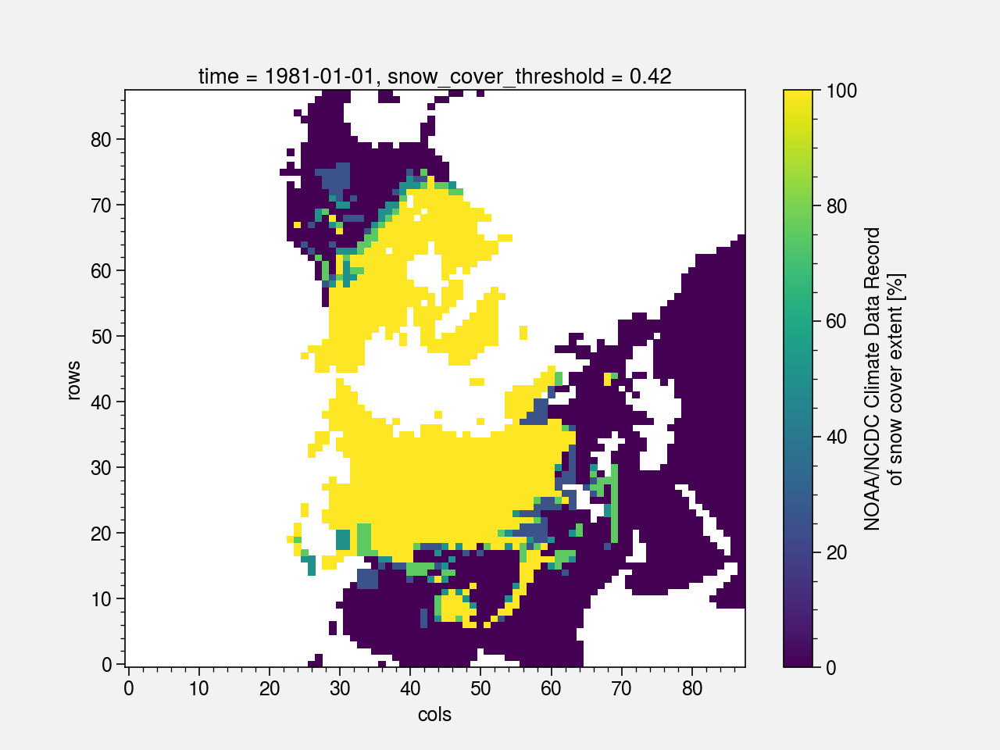

In [7]:
obs[0].plot()

### Regrid using xESMF (https://xesmf.readthedocs.io/en/latest/) 
Value of cells in the new grid that are outside the old grid's domain #15 (https://github.com/JiaweiZhuang/xESMF/issues/15)

In [7]:
# For adding NaN values outside of the grid, otherwise it puts 0 (see issue just up #15)
import scipy
def add_matrix_NaNs(regridder):
    X = regridder.weights
    M = scipy.sparse.csr_matrix(X)
    num_nonzeros = np.diff(M.indptr)
    M[num_nonzeros == 0, 0] = np.NaN
    regridder.weights = scipy.sparse.coo_matrix(M)
    return regridder

# Make the regrider
regridder_obs = xe.Regridder(obs, da_historical, 'bilinear', periodic=False, reuse_weights=True)
regridder_obs = add_matrix_NaNs(regridder_obs)
print(regridder_obs)

# Regrid the data
obs_regrid = regridder_obs(obs)

Reuse existing file: bilinear_88x88_143x144.nc


/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/scipy/sparse/_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


xESMF Regridder 
Regridding algorithm:       bilinear 
Weight filename:            bilinear_88x88_143x144.nc 
Reuse pre-computed weights? True 
Input grid shape:           (88, 88) 
Output grid shape:          (143, 144) 
Output grid dimension name: ('lat', 'lon') 
Periodic in longitude?      False


Text(0.5, 1.0, 'IPSL_CM6A_LR grid 143x144')

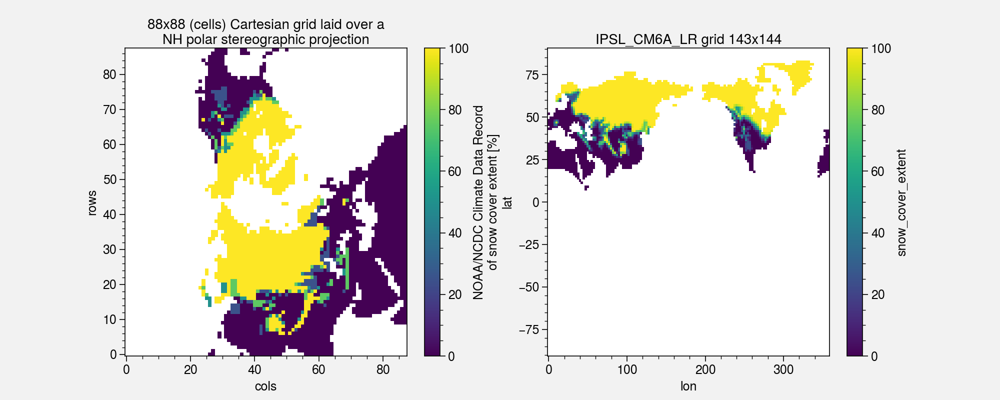

In [9]:
plt.figure(figsize=(10,4))
plt.subplot(121)
obs[0].plot()
plt.title('88x88 (cells) Cartesian grid laid over a\nNH polar stereographic projection')
plt.subplot(122)
obs_regrid[0].plot()
plt.title('IPSL_CM6A_LR grid 143x144')

### Regrid HR

In [8]:
# Regrid HighResMIP
regridder_HR = xe.Regridder(da_HR, da_historical, 'bilinear', periodic=True, reuse_weights=True)
print(regridder_HR)

# Regrid the data
da_HR_regrid = regridder_HR(da_HR)

Reuse existing file: bilinear_361x512_143x144_peri.nc
xESMF Regridder 
Regridding algorithm:       bilinear 
Weight filename:            bilinear_361x512_143x144_peri.nc 
Reuse pre-computed weights? True 
Input grid shape:           (361, 512) 
Output grid shape:          (143, 144) 
Output grid dimension name: ('lat', 'lon') 
Periodic in longitude?      True


Text(0.5, 1.0, 'da_HR_regrid')

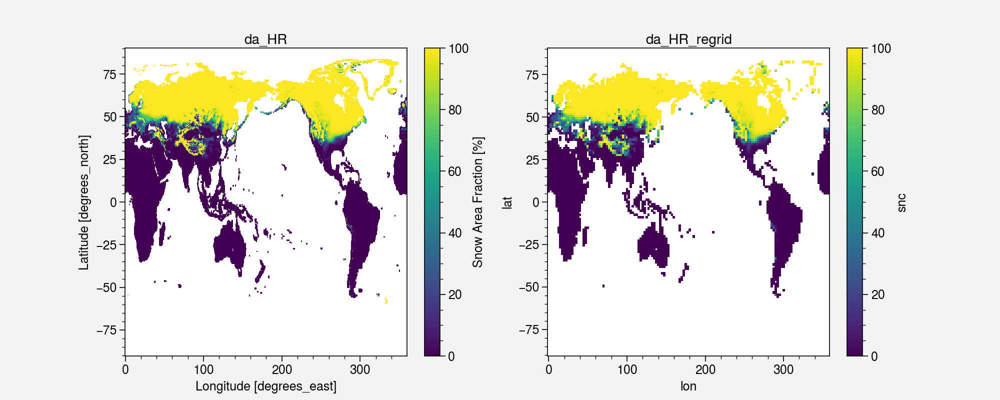

In [14]:
plt.figure(figsize=(10,4))
plt.subplot(121)
da_HR[0].plot()
plt.title('da_HR')
plt.subplot(122)
da_HR_regrid[0].plot()
plt.title('da_HR_regrid')

## Load ERA-Interim
- ERA-Interim (https://www.ecmwf.int/en/forecasts/datasets/reanalysis-datasets/era-interim)

The way the SCF is computed: https://confluence.ecmwf.int/display/CKB/ERA-Interim%3A+documentation#ERAInterim:documentation-Computationofnear-surfacehumidityandsnowcover

Finally the snow depth is already in water equivalent: https://apps.ecmwf.int/codes/grib/param-db/?id=33

So to compute the SCF: 

$$ \mathrm{SCF} = \mathrm{min}(1, \mathrm{RW} \times \frac{\mathrm{SD}}{15} ) $$  

where RW is density of water equal to 1000

In [9]:
sd = xr.open_mfdataset(
    '/bdd/ERAI/NETCDF/GLOBAL_075/1xmonthly/AN_SF/*/sd.*.asmei.GLOBAL_075.nc',
    combine='by_coords', parallel=True
).sd.sel(time=period).load()
sd

<xarray.DataArray 'sd' (time: 408, lat: 241, lon: 480)>
array([[[ 0.,  0.,  0., ...,  0.,  0.,  0.],
        [ 0.,  0.,  0., ...,  0.,  0.,  0.],
        [ 0.,  0.,  0., ...,  0.,  0.,  0.],
        ...,
        [10., 10., 10., ..., 10., 10., 10.],
        [10., 10., 10., ..., 10., 10., 10.],
        [10., 10., 10., ..., 10., 10., 10.]],

       [[ 0.,  0.,  0., ...,  0.,  0.,  0.],
        [ 0.,  0.,  0., ...,  0.,  0.,  0.],
        [ 0.,  0.,  0., ...,  0.,  0.,  0.],
        ...,
        [10., 10., 10., ..., 10., 10., 10.],
        [10., 10., 10., ..., 10., 10., 10.],
        [10., 10., 10., ..., 10., 10., 10.]],

       [[ 0.,  0.,  0., ...,  0.,  0.,  0.],
        [ 0.,  0.,  0., ...,  0.,  0.,  0.],
        [ 0.,  0.,  0., ...,  0.,  0.,  0.],
        ...,
        [10., 10., 10., ..., 10., 10., 10.],
        [10., 10., 10., ..., 10., 10., 10.],
        [10., 10., 10., ..., 10., 10., 10.]],

       ...,

       [[ 0.,  0.,  0., ...,  0.,  0.,  0.],
        [ 0.,  0.,  0., ...,  0.,  0.,  0.],
        [ 0.,  0.,  0., ...,  0.,  0.,  0.],
        ...,
        [10., 10., 10., ..., 10., 10., 10.],
        [10., 10., 10., ..., 10., 10., 10.],
        [10., 10., 10., ..., 10., 10., 10.]],

       [[ 0.,  0.,  0., ...,  0.,  0.,  0.],
        [ 0.,  0.,  0., ...,  0.,  0.,  0.],
        [ 0.,  0.,  0., ...,  0.,  0.,  0.],
        ...,
        [10., 10., 10., ..., 10., 10., 10.],
        [10., 10., 10., ..., 10., 10., 10.],
        [10., 10., 10., ..., 10., 10., 10.]],

       [[ 0.,  0.,  0., ...,  0.,  0.,  0.],
        [ 0.,  0.,  0., ...,  0.,  0.,  0.],
        [ 0.,  0.,  0., ...,  0.,  0.,  0.],
        ...,
        [10., 10., 10., ..., 10., 10., 10.],
        [10., 10., 10., ..., 10., 10., 10.],
        [10., 10., 10., ..., 10., 10., 10.]]], dtype=float32)
Coordinates:
  * lat      (lat) float64 90.0 89.25 88.5 87.75 ... -87.75 -88.5 -89.25 -90.0
  * lon      (lon) float64 0.0 0.75 1.5 2.25 3.0 ... 357.0 357.8 358.5 359.2
  * time     (time) datetime64[ns] 1981-01-01 1981-02-01 ... 2014-12-01
Attributes:
    long_name:     Snow depth
    units:         m of water equivalent
    num_GRIB:      141
    level_desc:    Surface
    dataset:       Analysis
    actual_range:  [ 0. 10.]

### Compute snow cover

In [10]:
tmp = 1000*sd/15
era = tmp.where(tmp<=1, 1)*100

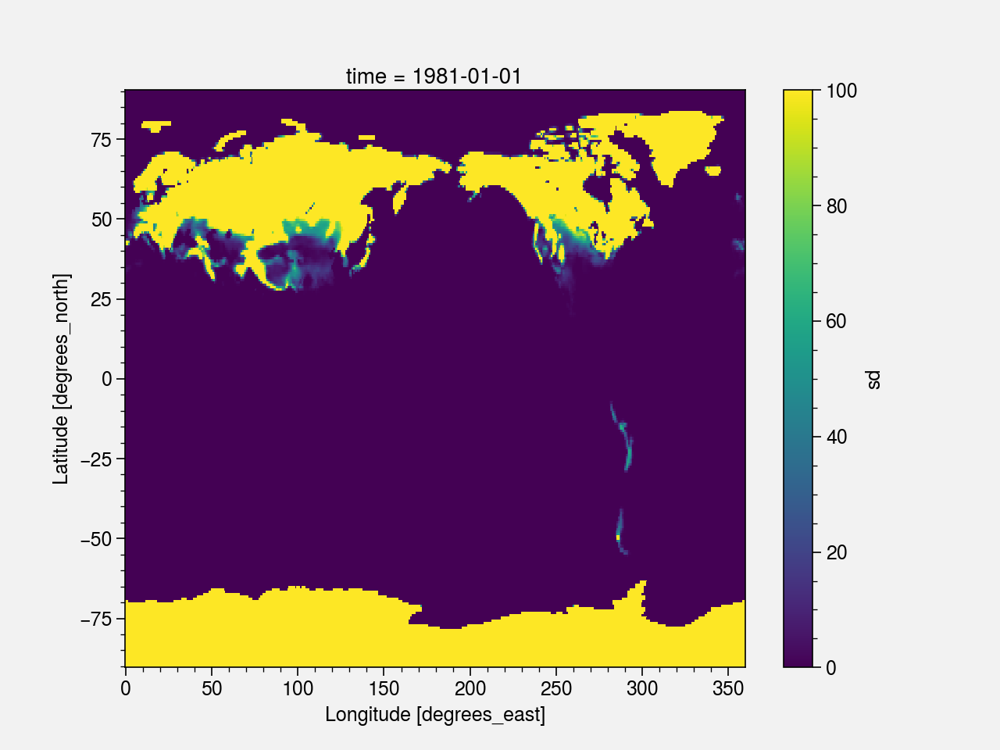

In [15]:
era[0].plot()

### Regrid

In [11]:
regridder_ERAI = xe.Regridder(era, da_historical, 'bilinear', periodic=True, reuse_weights=True)
era_regrid = regridder_ERAI(era)

Reuse existing file: bilinear_241x480_143x144_peri.nc


Text(0.5, 1.0, 'IPSL_CM6A_LR grid 143x144')

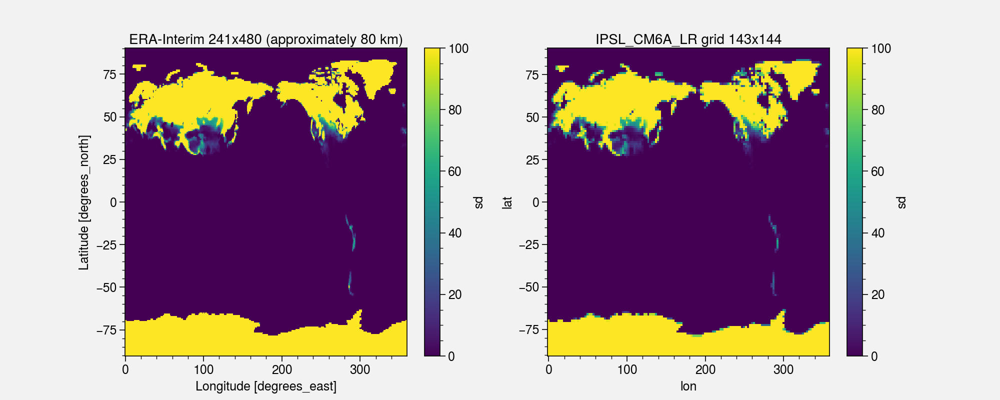

In [19]:
plt.figure(figsize=(10,4))
plt.subplot(121)
era[0].plot()
plt.title('ERA-Interim 241x480 (approximately 80 km)')
plt.subplot(122)
era_regrid[0].plot()
plt.title('IPSL_CM6A_LR grid 143x144')

## Annual Climatology
[#Load-ensemble-mean](#Load-ensemble-mean)  
[#Check-stations](#Check-stations)  
[#Check-monthly-data](#Check-monthly-data)  
[#Annual-Climatology](#Annual-Climatology)  
[#Bias](#Bias)  
[#Annual-cycle-ensemble-mean](#Annual-cycle-ensemble-mean)  
[#Time-series](#Time-series)  
[#Trends](#Trends)  
[#Link-with-orography?](#Link-with-orography?) 

In [24]:
latlim=(10,50)
lonlim=(60,110)

da_historical_clim = u.custom_season_clim(da_historical.sel(lat=slice(latlim[0],latlim[1]), lon=slice(lonlim[0],lonlim[1])), season='JJAS')
da_historical_clim.load()

da_amip_clim = u.custom_season_clim(da_amip.sel(lat=slice(latlim[0],latlim[1]), lon=slice(lonlim[0],lonlim[1])), season='JJAS')
da_amip_clim.load()

da_land_hist_clim = u.custom_season_clim(da_land_hist.sel(lat=slice(latlim[0],latlim[1]), lon=slice(lonlim[0],lonlim[1])), season='JJAS')
da_land_hist_clim.load()

da_HR_regrid_clim = u.custom_season_clim(da_HR_regrid.sel(lat=slice(latlim[0],latlim[1]), lon=slice(lonlim[0],lonlim[1])), season='JJAS')
da_HR_regrid_clim.load()

da_HR_clim = u.custom_season_clim(da_HR.sel(lat=slice(latlim[0],latlim[1]), lon=slice(lonlim[0],lonlim[1])), season='JJAS')
da_HR_clim.load()

obs_regrid_clim = u.custom_season_clim(obs_regrid.sel(lat=slice(latlim[0],latlim[1]), lon=slice(lonlim[0],lonlim[1])), season='JJAS')
obs_regrid_clim.load()

# obs_clim = u.custom_season_clim(obs.sel(lat=slice(latlim[0],latlim[1]), lon=slice(lonlim[0],lonlim[1])), season='JJAS')
# obs_clim.load()

era_regrid_clim = u.custom_season_clim(era_regrid.sel(lat=slice(latlim[0],latlim[1]), lon=slice(lonlim[0],lonlim[1])), season='JJAS')
era_regrid_clim.load()

era_clim = u.custom_season_clim(era.sel(lat=slice(latlim[1],latlim[0]), lon=slice(lonlim[0],lonlim[1])), season='JJAS')
era_clim.load()

<xarray.DataArray (lat: 53, lon: 67)>
array([[5.51788418e-03, 5.28797206e-03, 4.23037816e-03, ...,
        1.10845251e+00, 1.12528817e+00, 1.34587788e+00],
       [4.59823718e-04, 9.19647341e-05, 0.00000000e+00, ...,
        1.23225085e+00, 1.09330439e+00, 8.47338543e-01],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
        6.91093537e-01, 6.16738514e-01, 4.90401968e-01],
       ...,
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00]])
Coordinates:
  * lon      (lon) float64 60.0 60.75 61.5 62.25 ... 107.2 108.0 108.8 109.5
  * lat      (lat) float64 49.5 48.75 48.0 47.25 46.5 ... 12.75 12.0 11.25 10.5
    season   <U4 'JJAS'

In [25]:
# We remove HR for keeping the resolution

concat = xr.concat(
    [
        da_historical_clim,
        da_amip_clim,
        da_land_hist_clim,
    ],
    pd.Index(
        [
            'Historical (32)',
            'AMIP (21)',
            'land-hist (1)',
        ], 
        name='exp'
    )
)

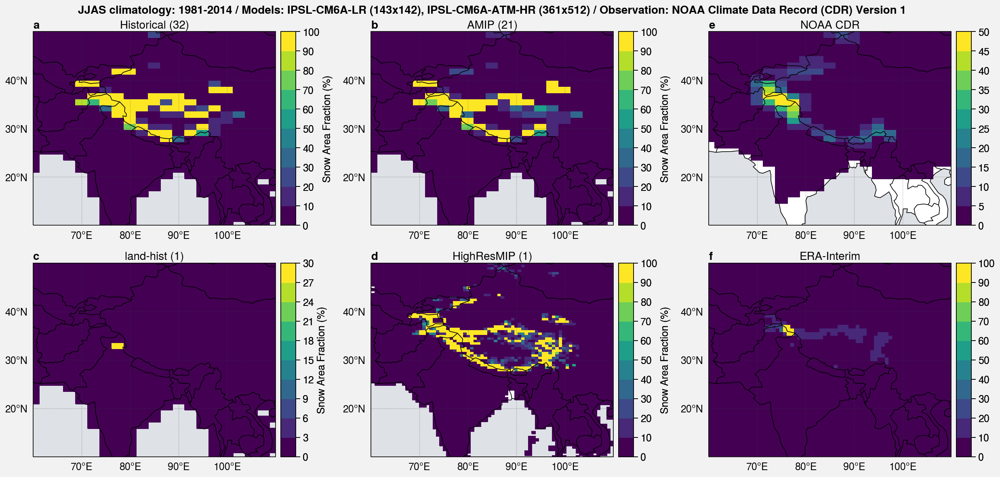

In [26]:
#Check colorbars 

f, axs = plot.subplots([[1, 2, 5], [3, 4, 6]], proj='cyl', share=3, axwidth=3)

for i, ax in enumerate(axs):
    if i < 3:
        m = ax.pcolormesh(concat.isel(exp=i), cmap=cmap, colorbar='r')
        ax.format(title=str(concat.isel(exp=i).exp.values))
    
axs[3].pcolormesh(da_HR_clim, cmap=cmap, colorbar='r')
axs[3].format(title='HighResMIP (1)') 

axs[4].pcolormesh(obs_regrid_clim, cmap=cmap, colorbar='r')
axs[4].format(title=obs_name)

axs[5].pcolormesh(era_clim, cmap=cmap, colorbar='r')
axs[5].format(title='ERA-Interim')

axs.format(
    geogridlinewidth=0.5, geogridcolor='gray8', geogridalpha=0.5, labels=True, 
    coast=True, ocean=True, oceancolor='gray3', borders=True,
    suptitle="JJAS climatology: 1981-2014 / Models: IPSL-CM6A-LR (143x142), IPSL-CM6A-ATM-HR (361x512) / Observation: "+obs_longname,
    lonlines=10, latlines=10, abc=True, latlim=latlim, lonlim=lonlim
)

In [105]:
concat.max()

<xarray.DataArray ()>
array(100.)

In [107]:
obs_regrid_clim.max()

<xarray.DataArray ()>
array(77.76428981)
Coordinates:
    snow_cover_threshold  float32 0.42

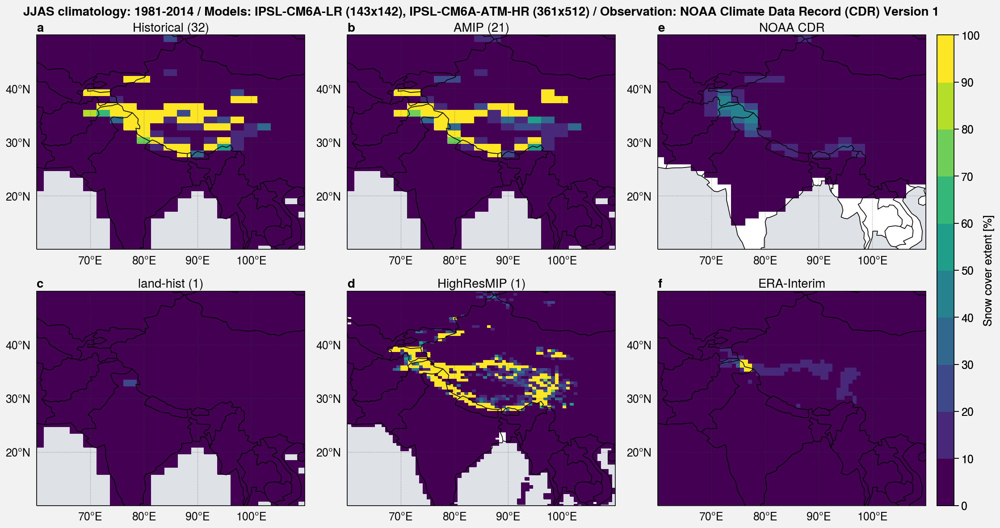

In [28]:
# Final plot

f, axs = plot.subplots([[1, 2, 5], [3, 4, 6]], proj='cyl', share=3, axwidth=3)

extend='neither'

for i, ax in enumerate(axs):
    if i < 3:
        m = ax.pcolormesh(concat.isel(exp=i), cmap=cmap, levels=levels, extend=extend)
        ax.format(title=str(concat.isel(exp=i).exp.values))
    
axs[3].pcolormesh(da_HR_clim, cmap=cmap, levels=levels, extend=extend)
axs[3].format(title='HighResMIP (1)') 

axs[4].pcolormesh(obs_regrid_clim, cmap=cmap, levels=levels, extend=extend)
axs[4].format(title=obs_name) 

axs[5].pcolormesh(era_clim, cmap=cmap, levels=levels, extend=extend)
axs[5].format(title='ERA-Interim')

f.colorbar(m, label=var_label)

axs.format(
    geogridlinewidth=0.5, geogridcolor='gray8', geogridalpha=0.5, labels=True, 
    coast=True, ocean=True, oceancolor='gray3', borders=True,
    suptitle="JJAS climatology: 1981-2014 / Models: IPSL-CM6A-LR (143x142), IPSL-CM6A-ATM-HR (361x512) / Observation: "+obs_longname,
    lonlines=10, latlines=10, abc=True, latlim=latlim, lonlim=lonlim
)

# f.save('img/'+var+'/JJAS_clim_'+var+'_IPSL_CMIP6.png')
# f.save('img/'+var+'/JJAS_clim_'+var+'_IPSL_CMIP6.pdf')

# Bias
[#Load-ensemble-mean](#Load-ensemble-mean)  
[#Check-stations](#Check-stations)  
[#Check-monthly-data](#Check-monthly-data)  
[#Annual-Climatology](#Annual-Climatology)  
[#Bias](#Bias)  
[#Annual-cycle-ensemble-mean](#Annual-cycle-ensemble-mean)  
[#Time-series](#Time-series)  
[#Trends](#Trends)  
[#Link-with-orography?](#Link-with-orography?) 

In [29]:
bias = xr.concat(
    [
        (da_historical_clim-obs_regrid_clim),
        (da_amip_clim-obs_regrid_clim),
        (da_land_hist_clim-obs_regrid_clim),
        (da_HR_regrid_clim-obs_regrid_clim)
    ],
    pd.Index(
        [
            'Historical (32) - '+obs_name,
            'AMIP (21) - '+obs_name,
            'land-hist (1) - '+obs_name,
            'HighResMIP (1) - '+obs_name
        ], 
        name='bias'
    )
)

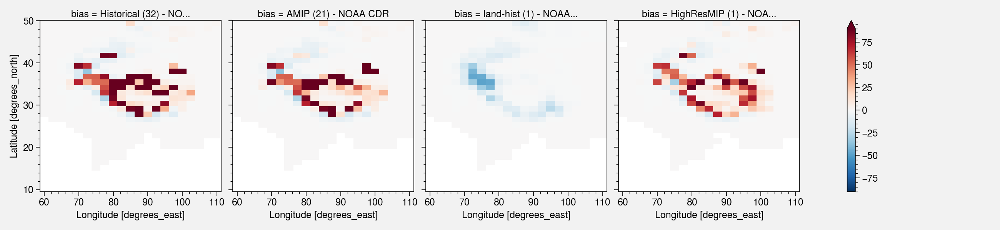

In [30]:
bias.plot(col='bias', robust=True)

In [31]:
bias.min()

<xarray.DataArray ()>
array(-48.32855085)
Coordinates:
    snow_cover_threshold  float32 0.42
    season                <U4 'JJAS'

In [32]:
bias.max()

<xarray.DataArray ()>
array(99.9148552)
Coordinates:
    snow_cover_threshold  float32 0.42
    season                <U4 'JJAS'

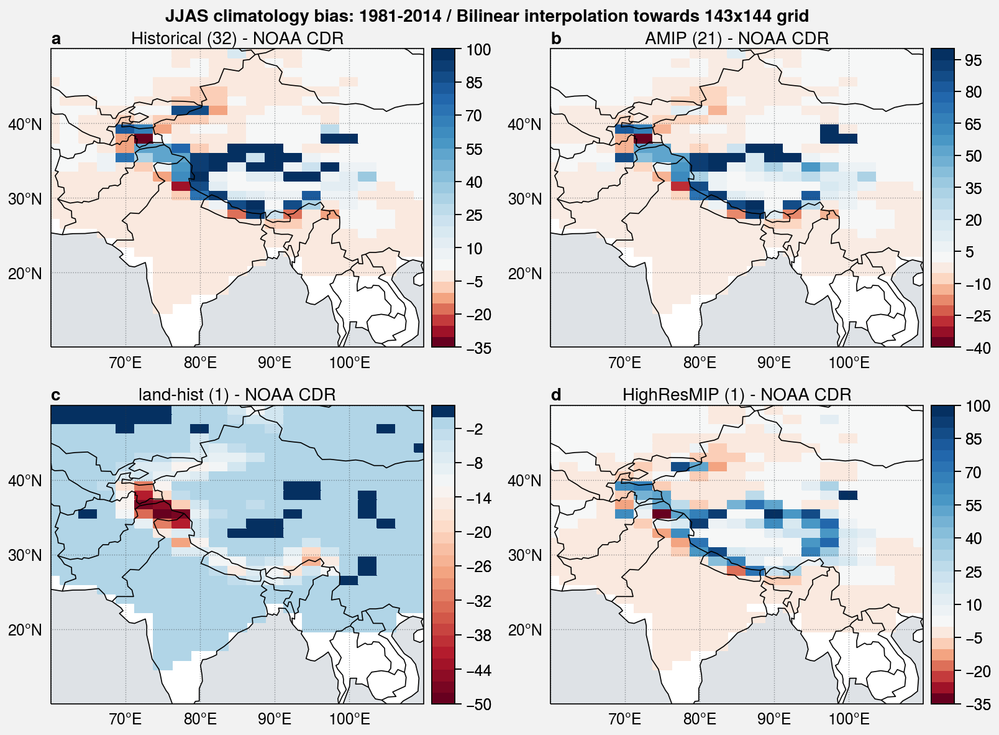

In [33]:
# Check colorbars extent

f, axs = plot.subplots(proj='cyl', ncols=2, nrows=2, share=3, axwidth=3)

for i, ax in enumerate(axs):
    m = ax.pcolormesh(
        bias.isel(bias=i), 
        cmap='RdBu',
        colorbar='r',
        norm='midpoint',
        levels=30
    )
    ax.format(title=str(bias.isel(bias=i).bias.values))

axs.format(
    geogridlinewidth=0.5, geogridcolor='gray8', geogridalpha=0.5, labels=True, 
    coast=True, ocean=True, oceancolor='gray3', borders=True,
    suptitle="JJAS climatology bias: 1981-2014 / Bilinear interpolation towards 143x144 grid",
    lonlines=10, latlines=10, abc=True, latlim=latlim, lonlim=lonlim
)

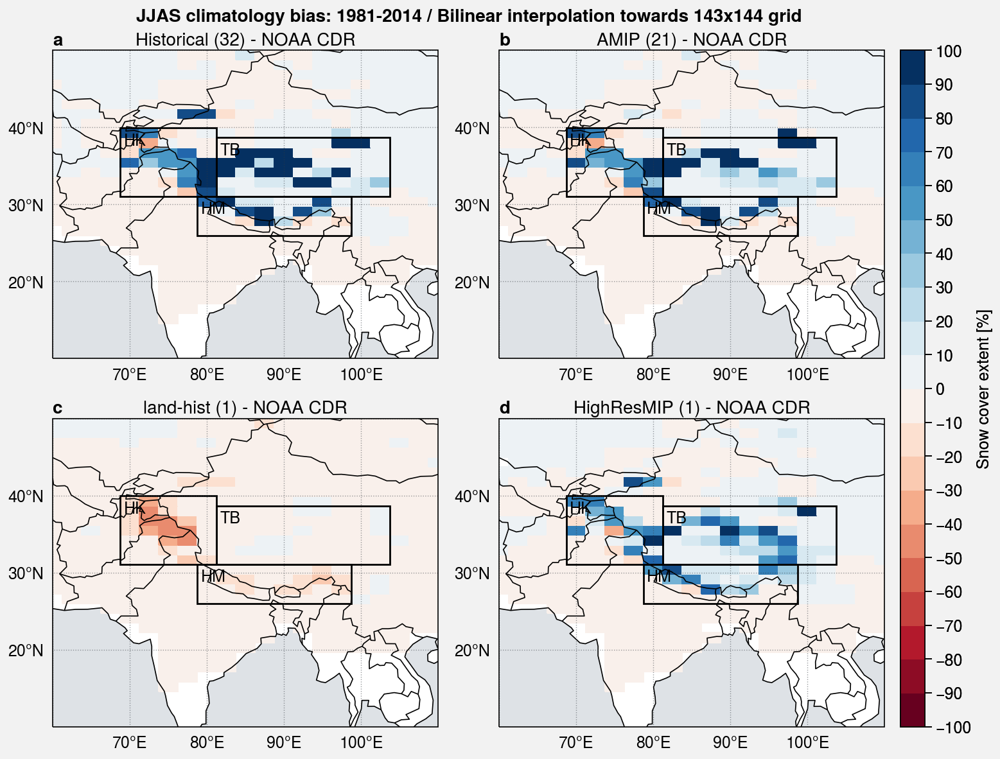

In [35]:
# Final plot

f, axs = plot.subplots(proj='cyl', ncols=2, nrows=2, share=3, axwidth=3)

for i, ax in enumerate(axs):
    m = ax.pcolormesh(
        bias.isel(bias=i), 
        cmap='RdBu', 
        levels=plot.arange(-100,100,10), 
#         extend='both',
#         norm='midpoint'
    )
    ax.format(title=str(bias.isel(bias=i).bias.values))

f.colorbar(m, label=var_label)

# Add boxes
for ax in axs:
    u.plot_zones_IPSL_CM6A_LR(ax)

axs.format(
    geogridlinewidth=0.5, geogridcolor='gray8', geogridalpha=0.5, labels=True, 
    coast=True, ocean=True, oceancolor='gray3', borders=True,
    suptitle="JJAS climatology bias: 1981-2014 / Bilinear interpolation towards 143x144 grid",
    lonlines=10, latlines=10, abc=True, latlim=latlim, lonlim=lonlim
)

# f.save('img/'+var+'/'+var+'_IPSL_CMIP6_bias_JJAS.png')
# f.save('img/'+var+'/'+var+'_IPSL_CMIP6_bias_JJAS.pdf')

# Link with orography?
[#Load-ensemble-mean](#Load-ensemble-mean)  
[#Check-stations](#Check-stations)  
[#Check-monthly-data](#Check-monthly-data)  
[#Annual-Climatology](#Annual-Climatology)  
[#Bias](#Bias)  
[#Link-with-orography?](#Link-with-orography?)  
[#Annual-cycle-ensemble-mean](#Annual-cycle-ensemble-mean)  
[#Time-series](#Time-series)  
[#Trends](#Trends)   

In [36]:
# Get orog files
orog = xr.open_dataarray(
    '/bdd/CMIP6/CMIP/IPSL/IPSL-CM6A-LR/historical/r1i1p1f1/fx/orog/gr/latest/orog_fx_IPSL-CM6A-LR_historical_r1i1p1f1_gr.nc'
).sel(lat=slice(latlim[0],latlim[1]), lon=slice(lonlim[0],lonlim[1]))
orog

mean_topo = xr.open_dataarray('mean_topo.nc').sel(lat=slice(latlim[0],latlim[1]), lon=slice(lonlim[0],lonlim[1]))
std_topo = xr.open_dataarray('std_topo.nc').sel(lat=slice(latlim[0],latlim[1]), lon=slice(lonlim[0],lonlim[1]))

# Zones
lonlim_HK, latlim_HK, lonlim_HM, latlim_HM, lonlim_TB, latlim_TB = u.get_zones_IPSL_CM6A_LR()

titles = ['HK', 'HM', 'TB']
zone_slices = [
    [slice(lonlim_HK[0],lonlim_HK[1]), slice(latlim_HK[0],latlim_HK[1])],
    [slice(lonlim_HM[0],lonlim_HM[1]), slice(latlim_HM[0],latlim_HM[1])],
    [slice(lonlim_TB[0],lonlim_TB[1]), slice(latlim_TB[0],latlim_TB[1])]
]

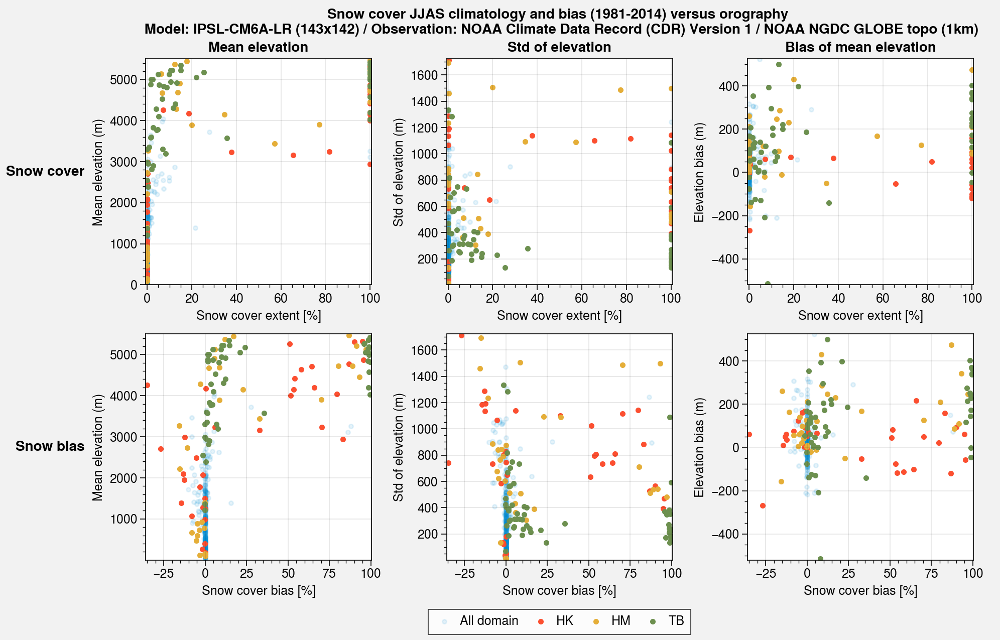

In [39]:
plot.rc.cycle = '538'

# Figure
f, axs = plot.subplots(nrows=2, ncols=3, share=0)

x = [concat[0], bias[0]]
xlabels = [var_label, var_label_bias]
y = [orog, std_topo, (orog-mean_topo)]
ylabels = ['Mean elevation (m)', 'Std of elevation (m)', 'Elevation bias (m)']

for i, ax in enumerate(axs):
    # ALL
    h1 = ax.scatter(x[i//3].values.flatten(), y[i%3].values.flatten(), alpha=0.1, label='All domain')
    # HK
    h2 = ax.scatter(
        x[i//3].sel(lon=zone_slices[0][0], lat=zone_slices[0][1]).values.flatten(), 
        y[i%3].sel(lon=zone_slices[0][0], lat=zone_slices[0][1]).values.flatten(), 
        label=titles[0]
    )
    # HM
    h3 = ax.scatter(
        x[i//3].sel(lon=zone_slices[1][0], lat=zone_slices[1][1]).values.flatten(), 
        y[i%3].sel(lon=zone_slices[1][0], lat=zone_slices[1][1]).values.flatten(), 
        label=titles[1]
    )
    # TB
    h4 = ax.scatter(
        x[i//3].sel(lon=zone_slices[2][0], lat=zone_slices[2][1]).values.flatten(), 
        y[i%3].sel(lon=zone_slices[2][0], lat=zone_slices[2][1]).values.flatten(), 
        label=titles[2]
    )
    ax.format(xlabel=xlabels[i//3], ylabel=ylabels[i%3])

axs.format(
    suptitle='Snow cover JJAS climatology and bias (1981-2014) versus orography \n Model: IPSL-CM6A-LR (143x142) / Observation: '+obs_longname+' / NOAA NGDC GLOBE topo (1km)',
    collabels=['Mean elevation', 'Std of elevation', 'Bias of mean elevation'],
    rowlabels=['Snow cover', 'Snow bias']
)

hs = [h1, h2, h3, h4]
f.legend(hs, loc='b', ncols=4, order='F', center=False, frame=True)

# f.save('img/'+var+'/orog_'+var+'_JJAS.png')
# f.save('img/'+var+'/orog_'+var+'_JJAS.pdf')

## Obs vs model

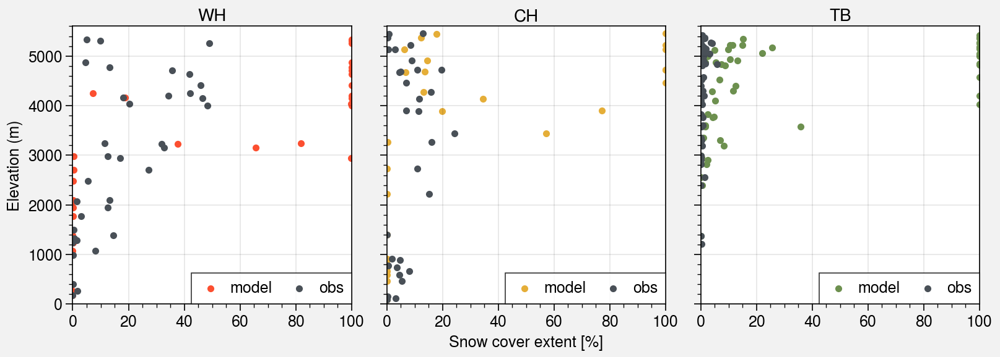

In [40]:
plot.rc.cycle = '538'

# Figure
f, axs = plot.subplots(nrows=1, ncols=3, share=3)
labels=['WH', 'CH', 'TB']
colors=['C1','C2','C3']

for i, ax in enumerate(axs):
    # Model
    ##########################
    x = concat[0].sel(lon=zone_slices[i][0], lat=zone_slices[i][1]).values.flatten()
    y = orog.sel(lon=zone_slices[i][0], lat=zone_slices[i][1]).values.flatten()
    xlabels = var_label
    ylabels = 'Elevation (m)'
    
    h1 = ax.scatter(x, y, label='model', color=colors[i])


    # Obs
    ###########################
    x = obs_regrid_clim.sel(lon=zone_slices[i][0], lat=zone_slices[i][1]).values.flatten()
    h2 = ax.scatter(x, y, label='obs', color='gray7')


    ax.format(xlabel=xlabels, ylabel=ylabels, xlim=(0,100), ylim=(0,5600), title=labels[i])
    
    hs = [h1, h2]
    ax.legend(hs, loc='lr')
    

# f.save('img/'+var+'/orog_'+var+'_obs_model_JJAS.png')
# f.save('img/'+var+'/orog_'+var+'_obs_model_JJAS.pdf')

# Annual cycle ensemble mean
[#Load-ensemble-mean](#Load-ensemble-mean)  
[#Check-stations](#Check-stations)  
[#Check-monthly-data](#Check-monthly-data)  
[#Annual-Climatology](#Annual-Climatology)  
[#Bias](#Bias)  
[#Link-with-orography?](#Link-with-orography?)  
[#Annual-cycle-ensemble-mean](#Annual-cycle-ensemble-mean)  
[#Time-series](#Time-series)  
[#Trends](#Trends)  
## Charger tout comme ça on fait les cycles annuels + time series avec le shading sur les 3 zones à la volé

In [12]:
plot.rc.cycle = 'colorblind'

realization = '*'
da_historical_ens = xr.open_mfdataset(
    '/bdd/CMIP6/CMIP/'+institute+'/'+model+'/historical/'+realization+'/'+table+'/'+var+'/gr/latest/*.nc', 
    combine='nested', concat_dim='realization', parallel=True
).sel(time=period, lon=slice(lonlim[0],lonlim[1]), lat=slice(latlim[0],latlim[1]))[var].load()

da_amip_ens = xr.open_mfdataset(
    '/bdd/CMIP6/CMIP/'+institute+'/'+model+'/amip/'+realization+'/'+table+'/'+var+'/gr/latest/*-201412.nc', 
    combine='nested', concat_dim='realization', parallel=True
).sel(time=period, lon=slice(lonlim[0],lonlim[1]), lat=slice(latlim[0],latlim[1]))[var].load()

In [42]:
da_historical_ens

<xarray.DataArray 'snc' (realization: 32, time: 408, lat: 32, lon: 21)>
array([[[[           nan,            nan,            nan, ...,
          0.00000000e+00, 0.00000000e+00,            nan],
         [           nan,            nan,            nan, ...,
          0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
         [           nan,            nan,            nan, ...,
          0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
         ...,
         [6.50849075e+01, 7.75144653e+01, 9.03422089e+01, ...,
          9.16194000e+01, 8.34559708e+01, 7.66388702e+01],
         [8.21843491e+01, 9.30191574e+01, 9.83706512e+01, ...,
          9.82357025e+01, 9.93711777e+01, 8.10276260e+01],
         [9.34365997e+01, 9.80028305e+01, 9.94383926e+01, ...,
          7.98819122e+01, 9.99484177e+01, 9.91848679e+01]],

        [[           nan,            nan,            nan, ...,
          0.00000000e+00, 0.00000000e+00,            nan],
         [           nan,            nan,            nan, ...,
          0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
         [           nan,            nan,            nan, ...,
          0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
         ...,
         [6.66315460e+01, 8.14096527e+01, 8.79785919e+01, ...,
          9.40613174e+01, 9.02723160e+01, 8.23995056e+01],
         [8.62066956e+01, 9.39825211e+01, 9.90043488e+01, ...,
          9.93541183e+01, 9.95463638e+01, 8.30490036e+01],
         [9.74833374e+01, 9.89244308e+01, 9.98736267e+01, ...,
          8.61971741e+01, 9.99455566e+01, 9.92049866e+01]],

        [[           nan,            nan,            nan, ...,
          0.00000000e+00, 0.00000000e+00,            nan],
         [           nan,            nan,            nan, ...,
          0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
         [           nan,            nan,            nan, ...,
          0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
         ...,
         [1.26898890e+01, 1.86237354e+01, 2.67308273e+01, ...,
          6.14508018e+01, 6.18461151e+01, 3.23323669e+01],
         [5.27446327e+01, 5.67781830e+01, 8.58979645e+01, ...,
          7.56153717e+01, 9.57862701e+01, 5.34334717e+01],
         [7.63594818e+01, 8.65219269e+01, 9.68493271e+01, ...,
          2.65021381e+01, 9.81249084e+01, 9.94185486e+01]],

        ...,

        [[           nan,            nan,            nan, ...,
          0.00000000e+00, 0.00000000e+00,            nan],
         [           nan,            nan,            nan, ...,
          0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
         [           nan,            nan,            nan, ...,
          0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
         ...,
         [0.00000000e+00, 0.00000000e+00, 2.51712452e-04, ...,
          1.87307930e+01, 3.59865046e+00, 1.39141393e+00],
         [0.00000000e+00, 5.09189861e-03, 2.25548744e-02, ...,
          1.01584263e+01, 4.10340538e+01, 1.38659906e+01],
         [5.97283470e-05, 9.71676223e-03, 2.52006650e-01, ...,
          9.11807179e-01, 3.24582405e+01, 3.72530403e+01]],

        [[           nan,            nan,            nan, ...,
          0.00000000e+00, 0.00000000e+00,            nan],
         [           nan,            nan,            nan, ...,
          0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
         [           nan,            nan,            nan, ...,
          0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
         ...,
         [1.37322402e+00, 1.85397124e+00, 9.77788639e+00, ...,
          3.40824547e+01, 1.70509281e+01, 1.09821260e+00],
         [1.27263908e+01, 3.61621094e+01, 3.68781891e+01, ...,
          2.49247684e+01, 7.65011368e+01, 3.31714106e+00],
         [4.07256813e+01, 4.00825043e+01, 3.41845474e+01, ...,
          1.60886822e+01, 7.92594681e+01, 8.84452133e+01]],

        [[           nan,            nan,            nan, ...,
          0.00000000e+00, 0.00000000e+00,            nan],
         [           nan,            nan,           

In [43]:
da_amip_ens

<xarray.DataArray 'snc' (realization: 21, time: 408, lat: 32, lon: 21)>
array([[[[           nan,            nan,            nan, ...,
          0.00000000e+00, 0.00000000e+00,            nan],
         [           nan,            nan,            nan, ...,
          0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
         [           nan,            nan,            nan, ...,
          0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
         ...,
         [6.97880707e+01, 7.29472580e+01, 8.49282684e+01, ...,
          8.32092514e+01, 9.44899139e+01, 8.33465729e+01],
         [8.24988251e+01, 7.99638062e+01, 9.04984741e+01, ...,
          9.67473221e+01, 9.91894836e+01, 7.29508286e+01],
         [9.86866531e+01, 9.79860687e+01, 9.65105286e+01, ...,
          9.20745926e+01, 9.99432983e+01, 9.93482742e+01]],

        [[           nan,            nan,            nan, ...,
          0.00000000e+00, 0.00000000e+00,            nan],
         [           nan,            nan,            nan, ...,
          0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
         [           nan,            nan,            nan, ...,
          0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
         ...,
         [9.49019241e+01, 9.65885925e+01, 9.88366013e+01, ...,
          8.93252716e+01, 9.64568176e+01, 8.85400620e+01],
         [9.60837402e+01, 9.81941376e+01, 9.96195755e+01, ...,
          9.89654007e+01, 9.97005692e+01, 8.63579025e+01],
         [9.92892075e+01, 9.96899567e+01, 9.98821487e+01, ...,
          9.61013336e+01, 9.99841766e+01, 9.98728561e+01]],

        [[           nan,            nan,            nan, ...,
          0.00000000e+00, 0.00000000e+00,            nan],
         [           nan,            nan,            nan, ...,
          0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
         [           nan,            nan,            nan, ...,
          0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
         ...,
         [2.48568020e+01, 3.57096291e+01, 3.82510910e+01, ...,
          8.41169281e+01, 9.42345963e+01, 7.20889511e+01],
         [2.99510231e+01, 3.74128075e+01, 4.88862610e+01, ...,
          9.56590729e+01, 9.91987534e+01, 8.14766769e+01],
         [4.66314774e+01, 4.82634201e+01, 6.13872375e+01, ...,
          8.53520508e+01, 9.96688538e+01, 9.96555786e+01]],

        ...,

        [[           nan,            nan,            nan, ...,
          0.00000000e+00, 0.00000000e+00,            nan],
         [           nan,            nan,            nan, ...,
          0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
         [           nan,            nan,            nan, ...,
          0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
         ...,
         [0.00000000e+00, 0.00000000e+00, 2.56333260e-06, ...,
          2.28785610e+00, 1.06807184e+00, 4.54846770e-02],
         [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
          3.28555536e+00, 1.41039553e+01, 8.05851817e-01],
         [5.66424951e-02, 0.00000000e+00, 4.09514469e-05, ...,
          4.51174593e+00, 2.24890251e+01, 3.01810360e+01]],

        [[           nan,            nan,            nan, ...,
          0.00000000e+00, 0.00000000e+00,            nan],
         [           nan,            nan,            nan, ...,
          0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
         [           nan,            nan,            nan, ...,
          0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
         ...,
         [1.49695016e-02, 2.58302229e-04, 3.09618134e-02, ...,
          7.99991846e+00, 9.60347652e-01, 1.73859539e+01],
         [6.30191028e-01, 6.30258441e-01, 1.73288450e-01, ...,
          9.93724060e+00, 5.80710526e+01, 1.39053650e+01],
         [7.14182317e-01, 1.65417820e-01, 7.27931559e-02, ...,
          2.12944717e+01, 7.41651993e+01, 5.06689415e+01]],

        [[           nan,            nan,            nan, ...,
          0.00000000e+00, 0.00000000e+00,            nan],
         [           nan,            nan,           

In [13]:
lonlim_HK, latlim_HK, lonlim_HM, latlim_HM, lonlim_TB, latlim_TB = u.get_zones_IPSL_CM6A_LR()

titles = ['HK', 'HM', 'TB']
zone_slices = [
    [slice(lonlim_HK[0],lonlim_HK[1]), slice(latlim_HK[0],latlim_HK[1])],
    [slice(lonlim_HM[0],lonlim_HM[1]), slice(latlim_HM[0],latlim_HM[1])],
    [slice(lonlim_TB[0],lonlim_TB[1]), slice(latlim_TB[0],latlim_TB[1])]
]

# Annual cycle r1i1p1f1

In [45]:
realization = 'r1i1p1f1'

# Load historical
da_historical_r1i1p1f1 = xr.open_mfdataset(
    '/bdd/CMIP6/CMIP/'+institute+'/'+model+'/historical/'+realization+'/'+table+'/'+var+'/gr/latest/*.nc', combine='by_coords'
).sel(time=period)[var]

# Load amip
da_amip_r1i1p1f1 = xr.open_mfdataset(
    '/bdd/CMIP6/CMIP/'+institute+'/'+model+'/amip/'+realization+'/'+table+'/'+var+'/gr/latest/*.nc', combine='by_coords'
).sel(time=period)[var]

# Time series
[#Load-ensemble-mean](#Load-ensemble-mean)  
[#Check-stations](#Check-stations)  
[#Check-monthly-data](#Check-monthly-data)  
[#Annual-Climatology](#Annual-Climatology)  
[#Bias](#Bias)  
[#Link-with-orography?](#Link-with-orography?)  
[#Annual-cycle-ensemble-mean](#Annual-cycle-ensemble-mean)  
[#Time-series](#Time-series)  
[#Trends](#Trends)   

## Test

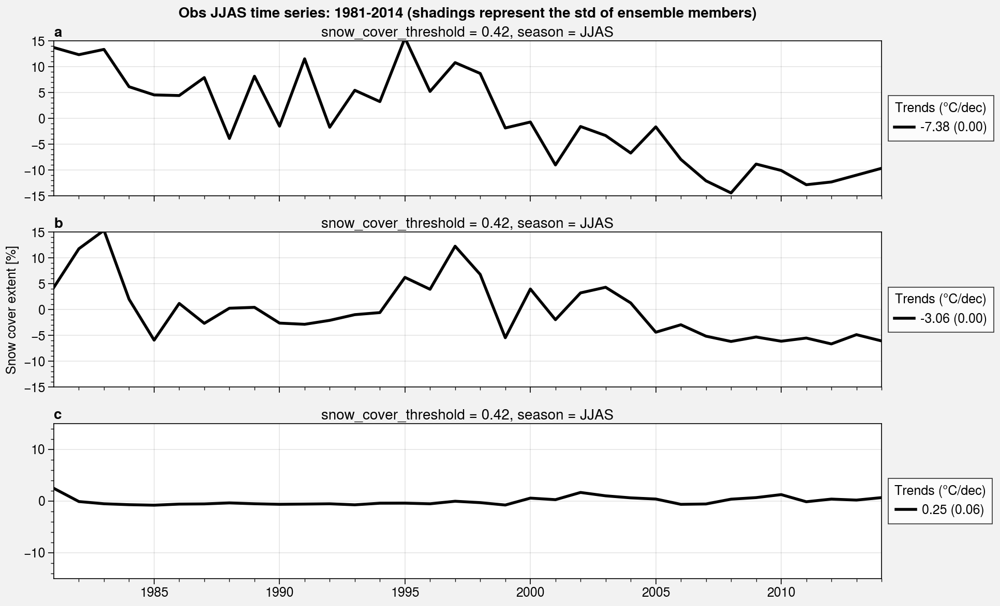

In [14]:
f, axs = plot.subplots(ncols=1, nrows=3, axwidth=8, axheight=1.5)

for i, ax in enumerate(axs): 
    ym_obs_regrid = (u.year_mean(u.spatial_average(
        obs_regrid.sel(lon=zone_slices[i][0], lat=zone_slices[i][1])
    ), season='JJAS') - u.custom_season_clim(u.spatial_average(
        obs_regrid.sel(lon=zone_slices[i][0], lat=zone_slices[i][1])
    ), season='JJAS')).load()
    
    # Obs
    h = ym_obs_regrid.plot(ax=ax, label=obs_name, color='black', linewidth=2)
    x = ym_obs_regrid.year ; y = ym_obs_regrid
    r = stats.linregress(x, y)
    t = '{:.2f}'.format(r.slope*10) + ' ({:.2f})'.format(r.pvalue)
    
    ax.legend(h[0], [t], title='Trends (°C/dec)', loc='r', ncols=1)

axs.format(
    xlabel='', ylabel=var_label,
    suptitle='Obs JJAS time series: 1981-2014 (shadings represent the std of ensemble members)', abc=True,
    ylim=(-15,15)
)

## anomalies - u.clim(obs)

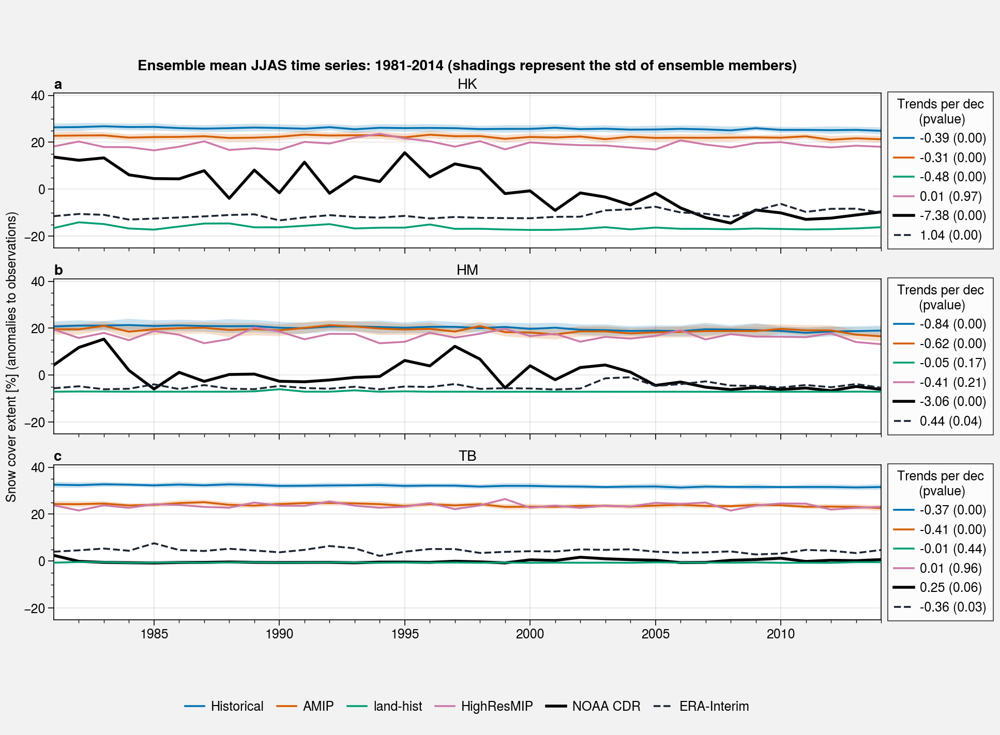

In [16]:
f, axs = plot.subplots(ncols=1, nrows=3, axwidth=8, axheight=1.5, share=3, hspace=0.3)

for i, ax in enumerate(axs):
    
    # Compute time series on the zone
    # Ensemble
    ym_historical_ens = (u.year_mean(u.spatial_average(da_historical_ens.sel(lon=zone_slices[i][0], lat=zone_slices[i][1])), season='JJAS') \
              - u.custom_season_clim(u.spatial_average(obs_regrid.sel(lon=zone_slices[i][0], lat=zone_slices[i][1])), season='JJAS')).load()
    ym_amip_ens = (u.year_mean(u.spatial_average(da_amip_ens.sel(lon=zone_slices[i][0], lat=zone_slices[i][1])), season='JJAS') \
        - u.custom_season_clim(u.spatial_average(obs_regrid.sel(lon=zone_slices[i][0], lat=zone_slices[i][1])), season='JJAS')).load()


    # Not ensemble
    ym_land_hist = (u.year_mean(u.spatial_average(da_land_hist.sel(lon=zone_slices[i][0], lat=zone_slices[i][1])), season='JJAS') \
         - u.custom_season_clim(u.spatial_average(obs_regrid.sel(lon=zone_slices[i][0], lat=zone_slices[i][1])), season='JJAS')).load()
    ym_HR_regrid = (u.year_mean(u.spatial_average(da_HR_regrid.sel(lon=zone_slices[i][0], lat=zone_slices[i][1])), season='JJAS') \
         - u.custom_season_clim(u.spatial_average(obs_regrid.sel(lon=zone_slices[i][0], lat=zone_slices[i][1])), season='JJAS')).load()
    ym_obs_regrid = (u.year_mean(u.spatial_average(obs_regrid.sel(lon=zone_slices[i][0], lat=zone_slices[i][1])), season='JJAS') \
          - u.custom_season_clim(u.spatial_average(obs_regrid.sel(lon=zone_slices[i][0], lat=zone_slices[i][1])), season='JJAS')).load()
    ym_era_regrid = (u.year_mean(u.spatial_average(era_regrid.sel(lon=zone_slices[i][0], lat=zone_slices[i][1])), season='JJAS') \
          - u.custom_season_clim(u.spatial_average(obs_regrid.sel(lon=zone_slices[i][0], lat=zone_slices[i][1])), season='JJAS')).load()    
        
    
    # historical
    x = ym_historical_ens.year
    y = ym_historical_ens.mean('realization')
    std = ym_historical_ens.std('realization')
    h1 = y.plot(ax=ax, label='Historical')
    ax.fill_between(x, y-std, y+std, alpha=0.2)
    r = stats.linregress(x, y)
    t1 = '{:.2f}'.format(r.slope*10) + ' ({:.2f})'.format(r.pvalue)
    
    # amip
    x = ym_amip_ens.year
    y = ym_amip_ens.mean('realization')
    std = ym_historical_ens.std('realization')
    h2 = y.plot(ax=ax, label='AMIP')
    ax.fill_between(x, y-std, y+std, alpha=0.2)
    r = stats.linregress(x, y)
    t2 = '{:.2f}'.format(r.slope*10) + ' ({:.2f})'.format(r.pvalue)
    
    # land_hist
    y = ym_land_hist
    h3 = y.plot(ax=ax, label='land-hist', zorder=10)
    r = stats.linregress(x, y)
    t3 = '{:.2f}'.format(r.slope*10) + ' ({:.2f})'.format(r.pvalue)
    
    # HighResMIP
    y = ym_HR_regrid
    h4 = y.plot(ax=ax, label='HighResMIP')
    r = stats.linregress(x, y)
    t4 = '{:.2f}'.format(r.slope*10) + ' ({:.2f})'.format(r.pvalue)
    
    # Obs
    y = ym_obs_regrid
    h5 = y.plot(ax=ax, label=obs_name, color='black', linewidth=2)
    r = stats.linregress(x, y)
    t5 = '{:.2f}'.format(r.slope*10) + ' ({:.2f})'.format(r.pvalue)
    
    # ERA
    y = ym_era_regrid
    h6 = y.plot(ax=ax, label='ERA-Interim', color='dark', linestyle='--')
    r = stats.linregress(x, y)
    t6 = '{:.2f}'.format(r.slope*10) + ' ({:.2f})'.format(r.pvalue)
    
    
    ax.format(title=titles[i])
    hs = [h1, h2, h3, h4, h5, h6]
    hs_trends = [h1[0], h2[0], h3[0], h4[0], h5[0], h6[0]] # keep only the handles (not the label)

    ax.legend(hs_trends, [t1, t2, t3, t4, t5, t6], title='Trends per dec\n      (pvalue)', loc='r', ncols=1)


axs.format(
    xlabel='', ylabel=var_label + ' (anomalies to observations)',
    suptitle='Ensemble mean JJAS time series: 1981-2014 (shadings represent the std of ensemble members)', abc=True,
    ylim=(-25,41)
)
    
f.legend(hs, loc='b', ncols=6, order='F', center=False, frame=False)

# f.save('img/'+var+'/ym_ens_zones_'+var+'_ano-obs_JJAS.png')
# f.save('img/'+var+'/ym_ens_zones_'+var+'_ano-obs_JJAS.pdf')

## anomalies - u.clim(#) ("unbiased")

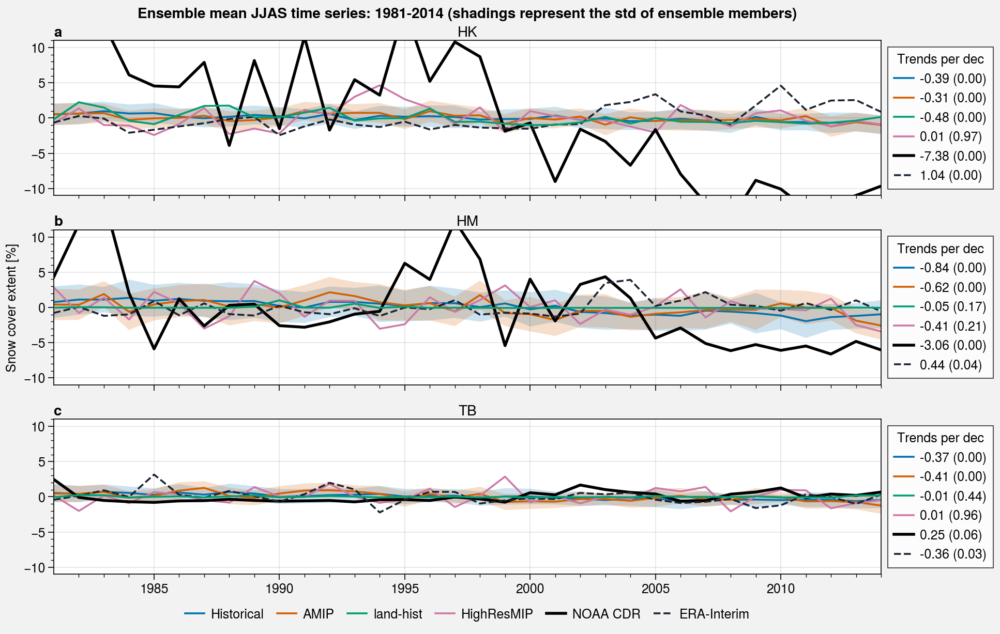

In [58]:
f, axs = plot.subplots(ncols=1, nrows=3, axwidth=8, axheight=1.5, share=3)

for i, ax in enumerate(axs):
    
    # Compute time series on the zone
    # Ensemble
    ym_historical_ens = (u.year_mean(u.spatial_average(da_historical_ens.sel(lon=zone_slices[i][0], lat=zone_slices[i][1])), season='JJAS') \
              - u.custom_season_clim(u.spatial_average(da_historical_ens.sel(lon=zone_slices[i][0], lat=zone_slices[i][1])), season='JJAS')).load()
    ym_amip_ens = (u.year_mean(u.spatial_average(da_amip_ens.sel(lon=zone_slices[i][0], lat=zone_slices[i][1])), season='JJAS') \
        - u.custom_season_clim(u.spatial_average(da_amip_ens.sel(lon=zone_slices[i][0], lat=zone_slices[i][1])), season='JJAS')).load()


    # Not ensemble
    ym_land_hist = (u.year_mean(u.spatial_average(da_land_hist.sel(lon=zone_slices[i][0], lat=zone_slices[i][1])), season='JJAS') \
         - u.custom_season_clim(u.spatial_average(da_land_hist.sel(lon=zone_slices[i][0], lat=zone_slices[i][1])), season='JJAS')).load()
    ym_HR_regrid = (u.year_mean(u.spatial_average(da_HR_regrid.sel(lon=zone_slices[i][0], lat=zone_slices[i][1])), season='JJAS') \
         - u.custom_season_clim(u.spatial_average(da_HR_regrid.sel(lon=zone_slices[i][0], lat=zone_slices[i][1])), season='JJAS')).load()
    ym_obs_regrid = (u.year_mean(u.spatial_average(obs_regrid.sel(lon=zone_slices[i][0], lat=zone_slices[i][1])), season='JJAS') \
          - u.custom_season_clim(u.spatial_average(obs_regrid.sel(lon=zone_slices[i][0], lat=zone_slices[i][1])), season='JJAS')).load()
    ym_era_regrid = (u.year_mean(u.spatial_average(era_regrid.sel(lon=zone_slices[i][0], lat=zone_slices[i][1])), season='JJAS') \
          - u.custom_season_clim(u.spatial_average(era_regrid.sel(lon=zone_slices[i][0], lat=zone_slices[i][1])), season='JJAS')).load()    
        
    
    # historical
    x = ym_historical_ens.year
    y = ym_historical_ens.mean('realization')
    std = ym_historical_ens.std('realization')
    h1 = y.plot(ax=ax, label='Historical')
    ax.fill_between(x, y-std, y+std, alpha=0.2)
    r = stats.linregress(x, y)
    t1 = '{:.2f}'.format(r.slope*10) + ' ({:.2f})'.format(r.pvalue)
    
    # amip
    x = ym_amip_ens.year
    y = ym_amip_ens.mean('realization')
    std = ym_historical_ens.std('realization')
    h2 = y.plot(ax=ax, label='AMIP')
    ax.fill_between(x, y-std, y+std, alpha=0.2)
    r = stats.linregress(x, y)
    t2 = '{:.2f}'.format(r.slope*10) + ' ({:.2f})'.format(r.pvalue)
    
    # land_hist
    y = ym_land_hist
    h3 = y.plot(ax=ax, label='land-hist', zorder=10)
    r = stats.linregress(x, y)
    t3 = '{:.2f}'.format(r.slope*10) + ' ({:.2f})'.format(r.pvalue)
    
    # HighResMIP
    y = ym_HR_regrid
    h4 = y.plot(ax=ax, label='HighResMIP')
    r = stats.linregress(x, y)
    t4 = '{:.2f}'.format(r.slope*10) + ' ({:.2f})'.format(r.pvalue)
    
    # Obs
    y = ym_obs_regrid
    h5 = y.plot(ax=ax, label=obs_name, color='black', linewidth=2)
    r = stats.linregress(x, y)
    t5 = '{:.2f}'.format(r.slope*10) + ' ({:.2f})'.format(r.pvalue)
    
    # ERA
    y = ym_era_regrid
    h6 = y.plot(ax=ax, label='ERA-Interim', color='dark', linestyle='--')
    r = stats.linregress(x, y)
    t6 = '{:.2f}'.format(r.slope*10) + ' ({:.2f})'.format(r.pvalue)
    
    
    ax.format(title=titles[i])
    hs = [h1, h2, h3, h4, h5, h6]
    hs_trends = [h1[0], h2[0], h3[0], h4[0], h5[0], h6[0]] # keep only the handles (not the label)

    ax.legend(hs_trends, [t1, t2, t3, t4, t5, t6], title='Trends per dec\n      (pvalue)', loc='r', ncols=1)


axs.format(
    xlabel='', ylabel=var_label,
    suptitle='Ensemble mean JJAS time series: 1981-2014 (shadings represent the std of ensemble members)', abc=True,
    ylim=(-11,11)
)
    
f.legend(hs, loc='b', ncols=6, order='F', center=False, frame=False)

# f.save('img/'+var+'/ym_ens_zones_'+var+'_JJAS.png')
# f.save('img/'+var+'/ym_ens_zones_'+var+'_JJAS.pdf')

# Trends
[#Load-ensemble-mean](#Load-ensemble-mean)  
[#Check-stations](#Check-stations)  
[#Check-monthly-data](#Check-monthly-data)  
[#Annual-Climatology](#Annual-Climatology)  
[#Bias](#Bias)  
[#Link-with-orography?](#Link-with-orography?)  
[#Annual-cycle-ensemble-mean](#Annual-cycle-ensemble-mean)  
[#Time-series](#Time-series)  
[#Trends](#Trends)   

Linregress: https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.linregress.html  
Issues linregress: https://github.com/scipy/scipy/issues/7074  
How to parallelize/vectorize: https://stackoverflow.com/questions/52094320/with-xarray-how-to-parallelize-1d-operations-on-a-multidimensional-dataset
Xarray / Dask example: http://martin-jung.github.io/post/2018-xarrayregression/

In [59]:
def corr(x, y, dim):
    return xr.apply_ufunc(
        stats.linregress, x, y,
        input_core_dims=[[dim], [dim]],
        output_core_dims=[[], [], [], [], []],
        vectorize=True
    )

In [60]:
# Add directly the results of linregress to arrays
# Compute year mean first
latlim=(10,50)
lonlim=(60,110)

ym_historical = u.year_mean(da_historical.sel(lat=slice(latlim[0],latlim[1]), lon=slice(lonlim[0],lonlim[1])), season='JJAS')
ym_historical.load()
for arr_name, arr in zip(['slope', 'intercept', 'rvalue', 'pvalue', 'stderr'], corr(ym_historical.year, ym_historical, 'year')):
    ym_historical[arr_name] = arr

ym_amip = u.year_mean(da_amip.sel(lat=slice(latlim[0],latlim[1]), lon=slice(lonlim[0],lonlim[1])), season='JJAS')
ym_amip.load()
for arr_name, arr in zip(['slope', 'intercept', 'rvalue', 'pvalue', 'stderr'], corr(ym_amip.year, ym_amip, 'year')):
    ym_amip[arr_name] = arr

ym_land_hist = u.year_mean(da_land_hist.sel(lat=slice(latlim[0],latlim[1]), lon=slice(lonlim[0],lonlim[1])), season='JJAS')
ym_land_hist.load()
for arr_name, arr in zip(['slope', 'intercept', 'rvalue', 'pvalue', 'stderr'], corr(ym_land_hist.year, ym_land_hist, 'year')):
    ym_land_hist[arr_name] = arr

ym_HR_regrid = u.year_mean(da_HR_regrid.sel(lat=slice(latlim[0],latlim[1]), lon=slice(lonlim[0],lonlim[1])), season='JJAS')
ym_HR_regrid.load()
for arr_name, arr in zip(['slope', 'intercept', 'rvalue', 'pvalue', 'stderr'], corr(ym_HR_regrid.year, ym_HR_regrid, 'year')):
    ym_HR_regrid[arr_name] = arr

ym_HR = u.year_mean(da_HR.sel(lat=slice(latlim[0],latlim[1]), lon=slice(lonlim[0],lonlim[1])), season='JJAS')
ym_HR.load()
for arr_name, arr in zip(['slope', 'intercept', 'rvalue', 'pvalue', 'stderr'], corr(ym_HR.year, ym_HR, 'year')):
    ym_HR[arr_name] = arr
    
ym_obs_regrid = u.year_mean(obs_regrid.sel(lat=slice(latlim[0],latlim[1]), lon=slice(lonlim[0],lonlim[1])), season='JJAS')
ym_obs_regrid.load()
for arr_name, arr in zip(['slope', 'intercept', 'rvalue', 'pvalue', 'stderr'], corr(ym_obs_regrid.year, ym_obs_regrid, 'year')):
    ym_obs_regrid[arr_name] = arr

# ym_obs = u.year_mean(obs.sel(lat=slice(latlim[0],latlim[1]), lon=slice(lonlim[0],lonlim[1])), season='JJAS')
# ym_obs.load()
# for arr_name, arr in zip(['slope', 'intercept', 'rvalue', 'pvalue', 'stderr'], corr(ym_obs.year, ym_obs, 'year')):
#     ym_obs[arr_name] = arr

ym_era_regrid = u.year_mean(era_regrid.sel(lat=slice(latlim[0],latlim[1]), lon=slice(lonlim[0],lonlim[1])), season='JJAS')
ym_era_regrid.load()
for arr_name, arr in zip(['slope', 'intercept', 'rvalue', 'pvalue', 'stderr'], corr(ym_era_regrid.year, ym_era_regrid, 'year')):
    ym_era_regrid[arr_name] = arr

ym_era = u.year_mean(era.sel(lat=slice(latlim[1],latlim[0]), lon=slice(lonlim[0],lonlim[1])), season='JJAS')
ym_era.load()
for arr_name, arr in zip(['slope', 'intercept', 'rvalue', 'pvalue', 'stderr'], corr(ym_era.year, ym_era, 'year')):
    ym_era[arr_name] = arr

In [61]:
# We remove HR for keeping the resolution

concat = xr.concat(
    [
        ym_historical,
        ym_amip,
        ym_land_hist,
    ],
    pd.Index(
        [
            'Historical (32)',
            'AMIP (21)',
            'land-hist (1)',
        ], 
        name='exp'
    )
)

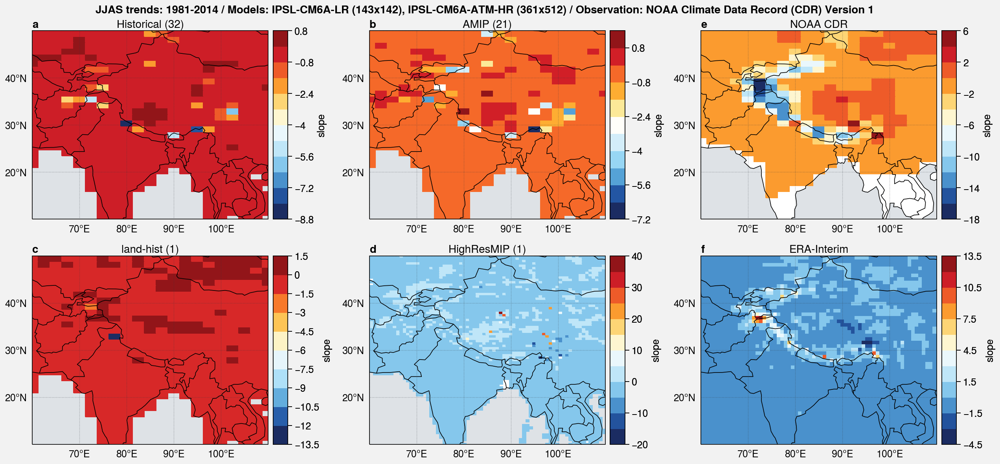

In [62]:
#Check colorbars 

f, axs = plot.subplots([[1, 2, 5], [3, 4, 6]], proj='cyl', share=3, axwidth=3)

cmap='ColdHot'

for i, ax in enumerate(axs):
    if i < 3:
        m = ax.pcolormesh(concat.isel(exp=i).slope*10, cmap=cmap, colorbar='r')
        ax.format(title=str(concat.isel(exp=i).exp.values))
    
axs[3].pcolormesh(ym_HR.slope*10, cmap=cmap, colorbar='r')
axs[3].format(title='HighResMIP (1)') 

axs[4].pcolormesh(ym_obs_regrid.slope*10, cmap=cmap, colorbar='r')
axs[4].format(title=obs_name)

axs[5].pcolormesh(ym_era.slope*10, cmap=cmap, colorbar='r')
axs[5].format(title='ERA-Interim')

axs.format(
    geogridlinewidth=0.5, geogridcolor='gray8', geogridalpha=0.5, labels=True, 
    coast=True, ocean=True, oceancolor='gray3', borders=True,
    suptitle="JJAS trends: 1981-2014 / Models: IPSL-CM6A-LR (143x142), IPSL-CM6A-ATM-HR (361x512) / Observation: "+obs_longname,
    lonlines=10, latlines=10, abc=True, latlim=latlim, lonlim=lonlim
)

In [63]:
ym_obs_regrid.slope.max()*10

<xarray.DataArray 'slope' ()>
array(4.39190105)
Coordinates:
    snow_cover_threshold  float32 0.42

In [64]:
ym_obs_regrid.slope.min()*10

<xarray.DataArray 'slope' ()>
array(-16.99294962)
Coordinates:
    snow_cover_threshold  float32 0.42

In [101]:
var_label

'Snow cover extent [%]'

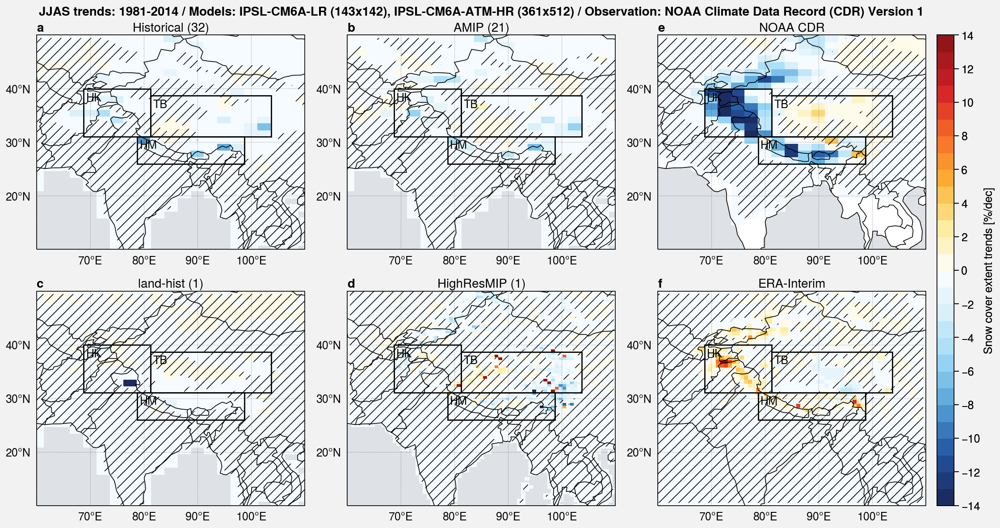

In [66]:
# Final plot

f, axs = plot.subplots([[1, 2, 5], [3, 4, 6]], proj='cyl', share=3, axwidth=3)

cmap='ColdHot'
levels=plot.arange(-14,14,1)
extend='neither'

for i, ax in enumerate(axs):
    if i < 3:
        m = ax.pcolormesh(concat.isel(exp=i).slope*10, cmap=cmap, levels=levels, extend=extend)
        if not (np.isnan(concat.isel(exp=i).pvalue.where(concat.isel(exp=i).pvalue>0.05)) == True ).all():
            ax.contourf(concat.isel(exp=i).pvalue.where(concat.isel(exp=i).pvalue>0.05), hatches=['///'], alpha=0)
        ax.format(title=str(concat.isel(exp=i).exp.values))
    
axs[3].pcolormesh(ym_HR.slope*10, cmap=cmap, levels=levels, extend=extend)
axs[3].contourf(ym_HR.pvalue.where(ym_HR.pvalue>0.05), hatches=['///'], alpha=0)
axs[3].format(title='HighResMIP (1)')

axs[4].pcolormesh(ym_obs_regrid.slope*10, cmap=cmap, levels=levels, extend=extend)
axs[4].contourf(ym_obs_regrid.pvalue.where(ym_obs_regrid.pvalue>0.05), hatches=['///'], alpha=0)
axs[4].format(title=obs_name)

axs[5].pcolormesh(ym_era.slope*10, cmap=cmap, levels=levels, extend=extend)
axs[5].contourf(ym_era.pvalue.where(ym_era.pvalue>0.05), hatches=['///'], alpha=0)
axs[5].format(title='ERA-Interim')

f.colorbar(m, label=var_label_trends, formatter=('simple', 3))

# Add boxes
for ax in axs:
    u.plot_zones_IPSL_CM6A_LR(ax)

# Format
axs.format(
    geogridlinewidth=0.5, geogridcolor='gray8', geogridalpha=0.5, labels=True, 
    coast=True, ocean=True, oceancolor='gray3', borders=True,
    suptitle="JJAS trends: 1981-2014 / Models: IPSL-CM6A-LR (143x142), IPSL-CM6A-ATM-HR (361x512) / Observation: "+obs_longname,
    lonlines=10, latlines=10, abc=True, latlim=latlim, lonlim=lonlim
)

# f.save('img/'+var+'/JJAS_trends_'+var+'_IPSL_CMIP6.png')
# f.save('img/'+var+'/JJAS_trends_'+var+'_IPSL_CMIP6.pdf')

## Compute trends for all members

In [22]:
realization = '*'
da_historical_ens = xr.open_mfdataset(
    '/bdd/CMIP6/CMIP/'+institute+'/'+model+'/historical/'+realization+'/'+table+'/'+var+'/gr/latest/*.nc', 
    combine='nested', concat_dim='realization', parallel=True
).sel(time=period, lon=slice(lonlim[0],lonlim[1]), lat=slice(latlim[0],latlim[1]))[var].load()

In [67]:
ym_historical_ens = u.year_mean(da_historical_ens , season='JJAS')
ym_historical_ens.load()

<xarray.DataArray (realization: 32, year: 34, lat: 32, lon: 21)>
array([[[[           nan,            nan,            nan, ...,
          0.00000000e+00, 0.00000000e+00,            nan],
         [           nan,            nan,            nan, ...,
          0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
         [           nan,            nan,            nan, ...,
          0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
         ...,
         [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
          1.69206496e-01, 4.77259209e-02, 5.29159799e-02],
         [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
          2.73154430e-05, 8.59197074e-01, 3.84444301e-01],
         [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
          5.22423932e-02, 8.99479042e-01, 1.54610442e+00]],

        [[           nan,            nan,            nan, ...,
          0.00000000e+00, 0.00000000e+00,            nan],
         [           nan,            nan,            nan, ...,
          0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
         [           nan,            nan,            nan, ...,
          0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
         ...,
         [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
          2.44789277e-01, 7.41684495e-01, 3.20296578e-01],
         [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
          6.02209289e-01, 4.98002635e+00, 1.26849110e+00],
         [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
          1.03042995e+00, 2.13001954e+00, 3.46790775e+00]],

        [[           nan,            nan,            nan, ...,
          0.00000000e+00, 0.00000000e+00,            nan],
         [           nan,            nan,            nan, ...,
          0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
         [           nan,            nan,            nan, ...,
          0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
         ...,
         [0.00000000e+00, 0.00000000e+00, 4.57999048e-05, ...,
          4.72482647e-02, 2.79849725e-01, 2.76635774e-01],
         [4.76254471e-04, 1.21733009e-05, 4.42147940e-04, ...,
          2.05865570e-01, 4.04076927e+00, 1.20203923e+00],
         [1.24957258e-04, 2.72951595e-07, 4.47718030e-03, ...,
          4.79509844e-04, 3.30357680e+00, 7.54812005e+00]],

        ...,

        [[           nan,            nan,            nan, ...,
          0.00000000e+00, 0.00000000e+00,            nan],
         [           nan,            nan,            nan, ...,
          0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
         [           nan,            nan,            nan, ...,
          0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
         ...,
         [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
          9.10704589e-03, 8.30729452e-02, 7.62411214e-04],
         [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
          1.29033564e-02, 1.93150092e+00, 5.88382348e-01],
         [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
          1.42677260e-02, 6.83155412e-01, 3.53838526e+00]],

        [[           nan,            nan,            nan, ...,
          0.00000000e+00, 0.00000000e+00,            nan],
         [           nan,            nan,            nan, ...,
          0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
         [           nan,            nan,            nan, ...,
          0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
         ...,
         [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
          2.00949799e-01, 6.98067094e-01, 1.00463785e-02],
         [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
          2.52852635e-01, 1.09785328e+00, 1.60974329e-01],
         [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
          7.33858396e-02, 5.70713499e-01, 7.68867749e-01]],

        [[           nan,            nan,            nan, ...,
          0.00000000e+00, 0.00000000e+00,            nan],
         [           nan,            nan,            nan, .

In [68]:
for arr_name, arr in zip(['slope', 'intercept', 'rvalue', 'pvalue', 'stderr'], corr(ym_historical_ens.year, ym_historical_ens, 'year')):
    ym_historical_ens[arr_name] = arr

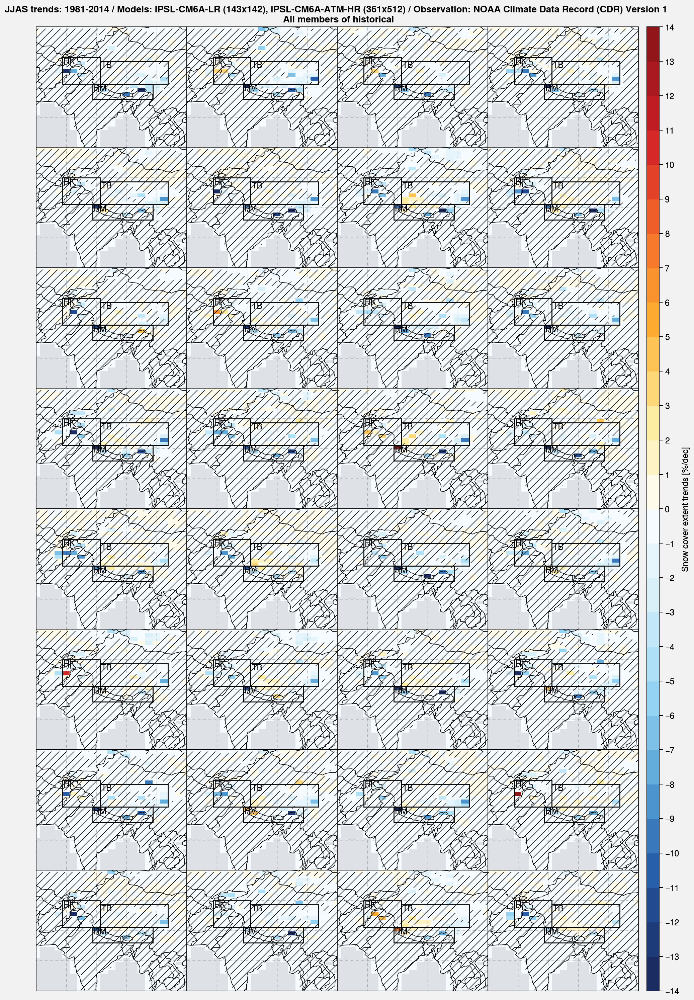

In [69]:
# Final plot

f, axs = plot.subplots(ncols=4, nrows=8, proj='cyl', space=0)

cmap='ColdHot'
levels=plot.arange(-14,14,1)
extend='neither'

for i, ax in enumerate(axs):
    m = ax.pcolormesh(ym_historical_ens[i].slope*10, cmap=cmap, levels=levels, extend=extend)
    if not (np.isnan(ym_historical_ens[i].pvalue.where(ym_historical_ens[i].pvalue>0.05)) == True ).all():
        ax.contourf(
            ym_historical_ens[i].pvalue.where(ym_historical_ens[i].pvalue>0.05), hatches=['///'], alpha=0
        )
    ax.format(title='')

f.colorbar(m, label=var_label_trends, formatter=('simple', 3))

# Add boxes
for ax in axs:
    u.plot_zones_IPSL_CM6A_LR(ax)

# Format
axs.format(
    geogridlinewidth=0.5, geogridcolor='gray8', geogridalpha=0.5, labels=False, 
    coast=True, ocean=True, oceancolor='gray3', borders=True,
    suptitle="JJAS trends: 1981-2014 / Models: IPSL-CM6A-LR (143x142) / All members of historical",
    lonlines=10, latlines=10, abc=False, latlim=latlim, lonlim=lonlim
)

f.save('img/'+var+'/JJAS_trends_'+var+'_IPSL_CMIP6_ens_historical.png')
f.save('img/'+var+'/JJAS_trends_'+var+'_IPSL_CMIP6_ens_historical.pdf')